In [68]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from ipywidgets import interact, widgets
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from pmdarima import auto_arima
from scipy.stats import zscore
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import zscore
from pmdarima import auto_arima
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.stats.diagnostic import acorr_ljungbox
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from pmdarima.arima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit

In [69]:
df_indicativos = pd.read_csv('estaciones_meteo.csv', sep=';', engine='python')

df_indicativos.drop(columns=['Unnamed: 6'], inplace=True)

df_indicativos

,INDICATIVO,NOMBRE,PROVINCIA,ALTITUD,LATITUD,LONGITUD
0,1387,A CORUÑA,A CORUÑA,58,432157 N,082517 W
1,1387E,"A CORUÑA, ALVEDRO",A CORUÑA,98,431825 N,082219 W
2,1428,"SANTIAGO DE COMPOSTELA, LABACOLLA",A CORUÑA,370,425317 N,082438 W
3,8178D,"ALBACETE, OBS.",ALBACETE,674,390020 N,015144 W
4,8175,"ALBACETE, LOS LLANOS",ALBACETE,702,385715 N,015123 W
...,...,...,...,...,...,...
90,2422,VALLADOLID,VALLADOLID,735,413827 N,044516 W
91,2539,"VALLADOLID, VILLANUBLA",VALLADOLID,846,414243 N,045120 W
92,2614,ZAMORA,ZAMORA,656,413056 N,054407 W
93,9390,DAROCA I,ZARAGOZA,779,410652 N,012436 W


In [70]:
indicativos_unicos = df_indicativos['INDICATIVO'].unique()

fechas = pd.date_range(start='2016-01-01', end='2023-12-01', freq='MS')

fecha_df = pd.DataFrame([(indicativo, fecha) for indicativo in indicativos_unicos for fecha in fechas], columns=['INDICATIVO', 'FECHA'])

fecha_df['FECHA'] = pd.to_datetime(fecha_df['FECHA'])

fecha_df

,INDICATIVO,FECHA
0,1387,2016-01-01
1,1387,2016-02-01
2,1387,2016-03-01
3,1387,2016-04-01
4,1387,2016-05-01
...,...,...
9115,9434,2023-08-01
9116,9434,2023-09-01
9117,9434,2023-10-01
9118,9434,2023-11-01


In [71]:
fecha_df.dtypes

INDICATIVO            object
FECHA         datetime64[ns]
dtype: object

# DATAFRAMES INDIVIDUALES

- df_date_gra
- df_date_llu
- df_date_nie
- df_date_nub
- df_date_sol
- df_date_eva
- df_date_hum
- df_date_ins
- df_date_lluv
- df_date_rad
- df_date_10
- df_date_20
- df_date_50
- df_date_max
- df_date_medmax
- df_date_min
- df_date_medmin
- df_date_sup1
- df_date_sup30
- df_date_tempsup30
- df_date_tempinf0
- df_date_wsup91
- df_date_wsup55

In [72]:
df_gra = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/DIAS_GRA.csv')

df_gra['FECHA'] = pd.to_datetime(df_gra['FECHA'], format="%Y-%d-%m")

df_date_gra = pd.merge(fecha_df, df_gra, on=['INDICATIVO', 'FECHA'], how='left')

df_date_gra

,INDICATIVO,FECHA,DIAS_GRA
0,1387,2016-01-01,0.0
1,1387,2016-02-01,2.0
2,1387,2016-03-01,0.0
3,1387,2016-04-01,0.0
4,1387,2016-05-01,0.0
...,...,...,...
9115,9434,2023-08-01,0.0
9116,9434,2023-09-01,1.0
9117,9434,2023-10-01,0.0
9118,9434,2023-11-01,0.0


In [73]:
df_llu = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/DIAS_LLU.csv')

df_llu['FECHA'] = pd.to_datetime(df_llu['FECHA'], format="%Y-%d-%m")

df_date_llu = pd.merge(fecha_df, df_llu, on=['INDICATIVO', 'FECHA'], how='left')

df_date_llu

,INDICATIVO,FECHA,DIAS_LLU
0,1387,2016-01-01,25.0
1,1387,2016-02-01,20.0
2,1387,2016-03-01,20.0
3,1387,2016-04-01,18.0
4,1387,2016-05-01,20.0
...,...,...,...
9115,9434,2023-08-01,2.0
9116,9434,2023-09-01,9.0
9117,9434,2023-10-01,13.0
9118,9434,2023-11-01,8.0


In [74]:
df_nie = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/DIAS_NIE.csv')

df_nie['FECHA'] = pd.to_datetime(df_nie['FECHA'], format="%Y-%d-%m")

df_date_nie = pd.merge(fecha_df, df_nie, on=['INDICATIVO', 'FECHA'], how='left')

df_date_nie

,INDICATIVO,FECHA,DIAS_NIE
0,1387,2016-01-01,0.0
1,1387,2016-02-01,0.0
2,1387,2016-03-01,0.0
3,1387,2016-04-01,0.0
4,1387,2016-05-01,0.0
...,...,...,...
9115,9434,2023-08-01,0.0
9116,9434,2023-09-01,0.0
9117,9434,2023-10-01,0.0
9118,9434,2023-11-01,0.0


In [75]:
df_nub = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/DIAS_NUB.csv')

df_nub['FECHA'] = pd.to_datetime(df_nub['FECHA'], format="%Y-%d-%m")

df_date_nub = pd.merge(fecha_df, df_nub, on=['INDICATIVO', 'FECHA'], how='left')

df_date_nub

,INDICATIVO,FECHA,DIAS_NUB
0,1387,2016-01-01,NaN
1,1387,2016-02-01,NaN
2,1387,2016-03-01,NaN
3,1387,2016-04-01,NaN
4,1387,2016-05-01,NaN
...,...,...,...
9115,9434,2023-08-01,16.0
9116,9434,2023-09-01,18.0
9117,9434,2023-10-01,17.0
9118,9434,2023-11-01,22.0


In [76]:
df_date_nub.isnull().sum()

INDICATIVO       0
FECHA            0
DIAS_NUB      2688
dtype: int64

In [77]:
df_date_nub[df_date_nub.INDICATIVO=='1387']

,INDICATIVO,FECHA,DIAS_NUB
0,1387,2016-01-01,NaN
1,1387,2016-02-01,NaN
2,1387,2016-03-01,NaN
3,1387,2016-04-01,NaN
4,1387,2016-05-01,NaN
...,...,...,...
91,1387,2023-08-01,23.0
92,1387,2023-09-01,25.0
93,1387,2023-10-01,15.0
94,1387,2023-11-01,18.0


In [78]:
df_sol = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/DIAS_SOL.csv')

df_sol['FECHA'] = pd.to_datetime(df_sol['FECHA'], format="%Y-%d-%m")

df_date_sol = pd.merge(fecha_df, df_sol, on=['INDICATIVO', 'FECHA'], how='left')

df_date_sol

,INDICATIVO,FECHA,DIAS_SOL
0,1387,2016-01-01,NaN
1,1387,2016-02-01,NaN
2,1387,2016-03-01,NaN
3,1387,2016-04-01,NaN
4,1387,2016-05-01,NaN
...,...,...,...
9115,9434,2023-08-01,15.0
9116,9434,2023-09-01,7.0
9117,9434,2023-10-01,7.0
9118,9434,2023-11-01,8.0


In [79]:
df_eva = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/EVAPORACION.csv')

df_eva['FECHA'] = pd.to_datetime(df_eva['FECHA'], format="%Y-%d-%m")

df_date_eva = pd.merge(fecha_df, df_eva, on=['INDICATIVO', 'FECHA'], how='left')

df_date_eva

,INDICATIVO,FECHA,EVAPORACION
0,1387,2016-01-01,551.0
1,1387,2016-02-01,645.0
2,1387,2016-03-01,0.0
3,1387,2016-04-01,637.0
4,1387,2016-05-01,603.0
...,...,...,...
9115,9434,2023-08-01,0.0
9116,9434,2023-09-01,0.0
9117,9434,2023-10-01,2068.0
9118,9434,2023-11-01,0.0


In [80]:
df_hum = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/HUMEDAD.csv')

df_hum['FECHA'] = pd.to_datetime(df_hum['FECHA'], format="%Y-%d-%m")

df_date_hum = pd.merge(fecha_df, df_hum, on=['INDICATIVO', 'FECHA'], how='left')

df_date_hum

,INDICATIVO,FECHA,HUMEDAD
0,1387,2016-01-01,79.0
1,1387,2016-02-01,80.0
2,1387,2016-03-01,76.0
3,1387,2016-04-01,77.0
4,1387,2016-05-01,79.0
...,...,...,...
9115,9434,2023-08-01,0.0
9116,9434,2023-09-01,0.0
9117,9434,2023-10-01,0.0
9118,9434,2023-11-01,0.0


In [81]:
df_ins = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/INSOLACION%.csv')

df_ins['FECHA'] = pd.to_datetime(df_ins['FECHA'], format="%Y-%d-%m")

df_date_ins = pd.merge(fecha_df, df_ins, on=['INDICATIVO', 'FECHA'], how='left')

df_date_ins

,INDICATIVO,FECHA,INSOLACION%
0,1387,2016-01-01,23.0
1,1387,2016-02-01,25.0
2,1387,2016-03-01,44.0
3,1387,2016-04-01,0.0
4,1387,2016-05-01,0.0
...,...,...,...
9115,9434,2023-08-01,86.0
9116,9434,2023-09-01,68.0
9117,9434,2023-10-01,61.0
9118,9434,2023-11-01,68.0


In [82]:
df_lluv = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/LLUVIA_MES.csv')

df_lluv['FECHA'] = pd.to_datetime(df_lluv['FECHA'], format="%Y-%d-%m")

df_date_lluv = pd.merge(fecha_df, df_lluv, on=['INDICATIVO', 'FECHA'], how='left')

df_date_lluv

,INDICATIVO,FECHA,LLUVIA_MES
0,1387,2016-01-01,292.0
1,1387,2016-02-01,201.6
2,1387,2016-03-01,196.5
3,1387,2016-04-01,122.4
4,1387,2016-05-01,89.8
...,...,...,...
9115,9434,2023-08-01,0.0
9116,9434,2023-09-01,48.6
9117,9434,2023-10-01,41.6
9118,9434,2023-11-01,24.6


In [83]:
df_rad = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/RADIACION.csv')

df_rad['FECHA'] = pd.to_datetime(df_rad['FECHA'], format="%Y-%d-%m")

df_date_rad = pd.merge(fecha_df, df_rad, on=['INDICATIVO', 'FECHA'], how='left')

df_date_rad

,INDICATIVO,FECHA,RADIACION
0,1387,2016-01-01,12371.0
1,1387,2016-02-01,17157.0
2,1387,2016-03-01,36935.0
3,1387,2016-04-01,48194.0
4,1387,2016-05-01,0.0
...,...,...,...
9115,9434,2023-08-01,NaN
9116,9434,2023-09-01,NaN
9117,9434,2023-10-01,NaN
9118,9434,2023-11-01,NaN


In [84]:
df_10 = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/TEMP_10cm.csv')

df_10['FECHA'] = pd.to_datetime(df_10['FECHA'], format="%Y-%d-%m")

df_date_10 = pd.merge(fecha_df, df_10, on=['INDICATIVO', 'FECHA'], how='left')

df_date_10

,INDICATIVO,FECHA,TEMP_10cm
0,1387,2016-01-01,11.0
1,1387,2016-02-01,10.8
2,1387,2016-03-01,12.1
3,1387,2016-04-01,13.5
4,1387,2016-05-01,16.9
...,...,...,...
9115,9434,2023-08-01,NaN
9116,9434,2023-09-01,NaN
9117,9434,2023-10-01,NaN
9118,9434,2023-11-01,NaN


In [85]:
df_20 = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/TEMP_20cm.csv')

df_20['FECHA'] = pd.to_datetime(df_20['FECHA'], format="%Y-%d-%m")

df_date_20 = pd.merge(fecha_df, df_20, on=['INDICATIVO', 'FECHA'], how='left')

df_date_20

,INDICATIVO,FECHA,TEMP_20cm
0,1387,2016-01-01,11.5
1,1387,2016-02-01,11.4
2,1387,2016-03-01,11.6
3,1387,2016-04-01,13.1
4,1387,2016-05-01,16.7
...,...,...,...
9115,9434,2023-08-01,NaN
9116,9434,2023-09-01,NaN
9117,9434,2023-10-01,NaN
9118,9434,2023-11-01,NaN


In [86]:
df_50 = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/TEMP_50cm.csv')

df_50['FECHA'] = pd.to_datetime(df_50['FECHA'], format="%Y-%d-%m")

df_date_50 = pd.merge(fecha_df, df_50, on=['INDICATIVO', 'FECHA'], how='left')

df_date_50

,INDICATIVO,FECHA,TEMP_50cm
0,1387,2016-01-01,NaN
1,1387,2016-02-01,NaN
2,1387,2016-03-01,NaN
3,1387,2016-04-01,NaN
4,1387,2016-05-01,NaN
...,...,...,...
9115,9434,2023-08-01,NaN
9116,9434,2023-09-01,NaN
9117,9434,2023-10-01,NaN
9118,9434,2023-11-01,NaN


In [87]:
df_max = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/TEMP_MAX.csv')

df_max['FECHA'] = pd.to_datetime(df_max['FECHA'], format="%Y-%d-%m")

df_date_max = pd.merge(fecha_df, df_max, on=['INDICATIVO', 'FECHA'], how='left')

df_date_max['TEMP_MAX'] = df_date_max['TEMP_MAX'].str.replace(r"\(.*\)", "", regex=True).astype(float)

df_date_max

,INDICATIVO,FECHA,TEMP_MAX
0,1387,2016-01-01,20.5
1,1387,2016-02-01,16.9
2,1387,2016-03-01,17.1
3,1387,2016-04-01,20.0
4,1387,2016-05-01,25.2
...,...,...,...
9115,9434,2023-08-01,41.7
9116,9434,2023-09-01,34.4
9117,9434,2023-10-01,33.9
9118,9434,2023-11-01,24.5


In [88]:
df_date_max.dtypes

INDICATIVO            object
FECHA         datetime64[ns]
TEMP_MAX             float64
dtype: object

In [89]:
df_medmax = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/TEMP_MEDIA_MAX.csv')

df_medmax['FECHA'] = pd.to_datetime(df_medmax['FECHA'], format="%Y-%d-%m")

df_date_medmax = pd.merge(fecha_df, df_medmax, on=['INDICATIVO', 'FECHA'], how='left')

df_date_medmax

,INDICATIVO,FECHA,TEMP_MEDIA_MAX
0,1387,2016-01-01,14.6
1,1387,2016-02-01,13.3
2,1387,2016-03-01,13.9
3,1387,2016-04-01,15.0
4,1387,2016-05-01,18.4
...,...,...,...
9115,9434,2023-08-01,34.3
9116,9434,2023-09-01,29.3
9117,9434,2023-10-01,25.6
9118,9434,2023-11-01,18.7


In [90]:
df_medmin = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/TEMP_MEDIA_MIN.csv')

df_medmin['FECHA'] = pd.to_datetime(df_medmin['FECHA'], format="%Y-%d-%m")

df_date_medmin = pd.merge(fecha_df, df_medmin, on=['INDICATIVO', 'FECHA'], how='left')

df_date_medmin

,INDICATIVO,FECHA,TEMP_MEDIA_MIN
0,1387,2016-01-01,9.5
1,1387,2016-02-01,8.7
2,1387,2016-03-01,8.2
3,1387,2016-04-01,9.1
4,1387,2016-05-01,12.1
...,...,...,...
9115,9434,2023-08-01,20.7
9116,9434,2023-09-01,17.3
9117,9434,2023-10-01,14.8
9118,9434,2023-11-01,8.9


In [91]:
df_min = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/TEMP_MIN.csv')

df_min['FECHA'] = pd.to_datetime(df_min['FECHA'], format="%Y-%d-%m")

df_date_min = pd.merge(fecha_df, df_min, on=['INDICATIVO', 'FECHA'], how='left')

df_date_min['TEMP_MIN'] = df_date_min['TEMP_MIN'].str.replace(r"\(.*\)", "", regex=True).astype(float)

df_date_min

,INDICATIVO,FECHA,TEMP_MIN
0,1387,2016-01-01,3.7
1,1387,2016-02-01,3.9
2,1387,2016-03-01,4.1
3,1387,2016-04-01,5.0
4,1387,2016-05-01,7.4
...,...,...,...
9115,9434,2023-08-01,15.6
9116,9434,2023-09-01,11.8
9117,9434,2023-10-01,9.8
9118,9434,2023-11-01,2.6


In [92]:
df_sup1 = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/LLUVIA_sup_1mm.csv')

df_sup1['FECHA'] = pd.to_datetime(df_sup1['FECHA'], format="%Y-%d-%m")

df_date_sup1 = pd.merge(fecha_df, df_sup1, on=['INDICATIVO', 'FECHA'], how='left')

df_date_sup1

,INDICATIVO,FECHA,LLUVIA_sup_1mm
0,1387,2016-01-01,20.0
1,1387,2016-02-01,18.0
2,1387,2016-03-01,17.0
3,1387,2016-04-01,15.0
4,1387,2016-05-01,15.0
...,...,...,...
9115,9434,2023-08-01,0.0
9116,9434,2023-09-01,8.0
9117,9434,2023-10-01,7.0
9118,9434,2023-11-01,6.0


In [93]:
df_sup30 = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/LLUVIA_sup_30mm.csv')

df_sup30['FECHA'] = pd.to_datetime(df_sup30['FECHA'], format="%Y-%d-%m")

df_date_sup30 = pd.merge(fecha_df, df_sup30, on=['INDICATIVO', 'FECHA'], how='left')

df_date_sup30

,INDICATIVO,FECHA,LLUVIA_sup_30mm
0,1387,2016-01-01,1.0
1,1387,2016-02-01,1.0
2,1387,2016-03-01,2.0
3,1387,2016-04-01,0.0
4,1387,2016-05-01,0.0
...,...,...,...
9115,9434,2023-08-01,0.0
9116,9434,2023-09-01,0.0
9117,9434,2023-10-01,0.0
9118,9434,2023-11-01,0.0


In [94]:
df_tempsup30 = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/TEMP_sup_30.csv')

df_tempsup30['FECHA'] = pd.to_datetime(df_tempsup30['FECHA'], format="%Y-%d-%m")

df_date_tempsup30 = pd.merge(fecha_df, df_tempsup30, on=['INDICATIVO', 'FECHA'], how='left')

df_date_tempsup30

,INDICATIVO,FECHA,TEMP_sup_30
0,1387,2016-01-01,0.0
1,1387,2016-02-01,0.0
2,1387,2016-03-01,0.0
3,1387,2016-04-01,0.0
4,1387,2016-05-01,0.0
...,...,...,...
9115,9434,2023-08-01,24.0
9116,9434,2023-09-01,14.0
9117,9434,2023-10-01,7.0
9118,9434,2023-11-01,0.0


In [95]:
df_tempinf0 = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/TEMP_inf_0.csv')

df_tempinf0['FECHA'] = pd.to_datetime(df_tempinf0['FECHA'], format="%Y-%d-%m")

df_date_tempinf0 = pd.merge(fecha_df, df_tempinf0, on=['INDICATIVO', 'FECHA'], how='left')

df_date_tempinf0

,INDICATIVO,FECHA,TEMP_inf_0
0,1387,2016-01-01,0.0
1,1387,2016-02-01,0.0
2,1387,2016-03-01,0.0
3,1387,2016-04-01,0.0
4,1387,2016-05-01,0.0
...,...,...,...
9115,9434,2023-08-01,0.0
9116,9434,2023-09-01,0.0
9117,9434,2023-10-01,0.0
9118,9434,2023-11-01,0.0


In [96]:
df_wsup55 = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/VIENTO_sup_55.csv')

df_wsup55['FECHA'] = pd.to_datetime(df_wsup55['FECHA'], format="%Y-%d-%m")

df_date_wsup55 = pd.merge(fecha_df, df_wsup55, on=['INDICATIVO', 'FECHA'], how='left')

df_date_wsup55

,INDICATIVO,FECHA,VIENTO_sup_55
0,1387,2016-01-01,NaN
1,1387,2016-02-01,NaN
2,1387,2016-03-01,NaN
3,1387,2016-04-01,NaN
4,1387,2016-05-01,NaN
...,...,...,...
9115,9434,2023-08-01,9.0
9116,9434,2023-09-01,3.0
9117,9434,2023-10-01,3.0
9118,9434,2023-11-01,12.0


In [97]:
df_wsup91 = pd.read_csv('/Users/angel/Desktop/FFINAL/FFINAL/csv_out/VIENTO_sup_91.csv')

df_wsup91['FECHA'] = pd.to_datetime(df_wsup91['FECHA'], format="%Y-%d-%m")

df_date_wsup91 = pd.merge(fecha_df, df_wsup91, on=['INDICATIVO', 'FECHA'], how='left')

df_date_wsup91

,INDICATIVO,FECHA,VIENTO_sup_91
0,1387,2016-01-01,NaN
1,1387,2016-02-01,NaN
2,1387,2016-03-01,NaN
3,1387,2016-04-01,NaN
4,1387,2016-05-01,NaN
...,...,...,...
9115,9434,2023-08-01,0.0
9116,9434,2023-09-01,0.0
9117,9434,2023-10-01,0.0
9118,9434,2023-11-01,1.0


# DATAFRAME CONJUNTO

In [207]:
nombres_dataframes = ['df_date_gra', 'df_date_llu', 'df_date_nie', 'df_date_nub', 'df_date_sol', 
                      'df_date_eva', 'df_date_hum', 'df_date_ins', 'df_date_lluv', 'df_date_rad',
                      'df_date_10', 'df_date_20', 'df_date_50', 'df_date_max', 'df_date_medmax', 
                      'df_date_min', 'df_date_medmin', 'df_date_sup1', 'df_date_sup30', 
                      'df_date_tempsup30', 'df_date_tempinf0', 'df_date_wsup91', 'df_date_wsup55']

df_final = fecha_df  
for nombre_df in nombres_dataframes:
    df = globals()[nombre_df]  
    df_final = pd.merge(df_final, df, on=['INDICATIVO', 'FECHA'], how='left')

df_final

,INDICATIVO,FECHA,DIAS_GRA,DIAS_LLU,DIAS_NIE,DIAS_NUB,DIAS_SOL,EVAPORACION,HUMEDAD,INSOLACION%,...,TEMP_MAX,TEMP_MEDIA_MAX,TEMP_MIN,TEMP_MEDIA_MIN,LLUVIA_sup_1mm,LLUVIA_sup_30mm,TEMP_sup_30,TEMP_inf_0,VIENTO_sup_91,VIENTO_sup_55
0,1387,2016-01-01,0.0,25.0,0.0,NaN,NaN,551.0,79.0,23.0,...,20.5,14.6,3.7,9.5,20.0,1.0,0.0,0.0,NaN,NaN
1,1387,2016-02-01,2.0,20.0,0.0,NaN,NaN,645.0,80.0,25.0,...,16.9,13.3,3.9,8.7,18.0,1.0,0.0,0.0,NaN,NaN
2,1387,2016-03-01,0.0,20.0,0.0,NaN,NaN,0.0,76.0,44.0,...,17.1,13.9,4.1,8.2,17.0,2.0,0.0,0.0,NaN,NaN
3,1387,2016-04-01,0.0,18.0,0.0,NaN,NaN,637.0,77.0,0.0,...,20.0,15.0,5.0,9.1,15.0,0.0,0.0,0.0,NaN,NaN
4,1387,2016-05-01,0.0,20.0,0.0,NaN,NaN,603.0,79.0,0.0,...,25.2,18.4,7.4,12.1,15.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9115,9434,2023-08-01,0.0,2.0,0.0,16.0,15.0,0.0,0.0,86.0,...,41.7,34.3,15.6,20.7,0.0,0.0,24.0,0.0,0.0,9.0
9116,9434,2023-09-01,1.0,9.0,0.0,18.0,7.0,0.0,0.0,68.0,...,34.4,29.3,11.8,17.3,8.0,0.0,14.0,0.0,0.0,3.0
9117,9434,2023-10-01,0.0,13.0,0.0,17.0,7.0,2068.0,0.0,61.0,...,33.9,25.6,9.8,14.8,7.0,0.0,7.0,0.0,0.0,3.0
9118,9434,2023-11-01,0.0,8.0,0.0,22.0,8.0,0.0,0.0,68.0,...,24.5,18.7,2.6,8.9,6.0,0.0,0.0,0.0,1.0,12.0


In [208]:
df_final['AÑO'] = df_final['FECHA'].dt.year
df_final['MES'] = df_final['FECHA'].dt.month

df_final.drop(columns=['FECHA'], inplace=True)

columnas = list(df_final.columns)
columnas.remove('INDICATIVO')
nuevas_columnas = ['INDICATIVO', 'AÑO', 'MES'] + [col for col in columnas if col not in ['AÑO', 'MES']]

df_final = df_final[nuevas_columnas]

df_final

,INDICATIVO,AÑO,MES,DIAS_GRA,DIAS_LLU,DIAS_NIE,DIAS_NUB,DIAS_SOL,EVAPORACION,HUMEDAD,...,TEMP_MAX,TEMP_MEDIA_MAX,TEMP_MIN,TEMP_MEDIA_MIN,LLUVIA_sup_1mm,LLUVIA_sup_30mm,TEMP_sup_30,TEMP_inf_0,VIENTO_sup_91,VIENTO_sup_55
0,1387,2016,1,0.0,25.0,0.0,NaN,NaN,551.0,79.0,...,20.5,14.6,3.7,9.5,20.0,1.0,0.0,0.0,NaN,NaN
1,1387,2016,2,2.0,20.0,0.0,NaN,NaN,645.0,80.0,...,16.9,13.3,3.9,8.7,18.0,1.0,0.0,0.0,NaN,NaN
2,1387,2016,3,0.0,20.0,0.0,NaN,NaN,0.0,76.0,...,17.1,13.9,4.1,8.2,17.0,2.0,0.0,0.0,NaN,NaN
3,1387,2016,4,0.0,18.0,0.0,NaN,NaN,637.0,77.0,...,20.0,15.0,5.0,9.1,15.0,0.0,0.0,0.0,NaN,NaN
4,1387,2016,5,0.0,20.0,0.0,NaN,NaN,603.0,79.0,...,25.2,18.4,7.4,12.1,15.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9115,9434,2023,8,0.0,2.0,0.0,16.0,15.0,0.0,0.0,...,41.7,34.3,15.6,20.7,0.0,0.0,24.0,0.0,0.0,9.0
9116,9434,2023,9,1.0,9.0,0.0,18.0,7.0,0.0,0.0,...,34.4,29.3,11.8,17.3,8.0,0.0,14.0,0.0,0.0,3.0
9117,9434,2023,10,0.0,13.0,0.0,17.0,7.0,2068.0,0.0,...,33.9,25.6,9.8,14.8,7.0,0.0,7.0,0.0,0.0,3.0
9118,9434,2023,11,0.0,8.0,0.0,22.0,8.0,0.0,0.0,...,24.5,18.7,2.6,8.9,6.0,0.0,0.0,0.0,1.0,12.0


In [100]:
df_final.dtypes

INDICATIVO          object
AÑO                  int64
MES                  int64
DIAS_GRA           float64
DIAS_LLU           float64
DIAS_NIE           float64
DIAS_NUB           float64
DIAS_SOL           float64
EVAPORACION        float64
HUMEDAD            float64
INSOLACION%        float64
LLUVIA_MES         float64
RADIACION          float64
TEMP_10cm          float64
TEMP_20cm          float64
TEMP_50cm          float64
TEMP_MAX           float64
TEMP_MEDIA_MAX     float64
TEMP_MIN           float64
TEMP_MEDIA_MIN     float64
LLUVIA_sup_1mm     float64
LLUVIA_sup_30mm    float64
TEMP_sup_30        float64
TEMP_inf_0         float64
VIENTO_sup_91      float64
VIENTO_sup_55      float64
dtype: object

In [101]:
df_final.isnull().sum()

INDICATIVO            0
AÑO                   0
MES                   0
DIAS_GRA            708
DIAS_LLU            708
DIAS_NIE            708
DIAS_NUB           2688
DIAS_SOL           2688
EVAPORACION        3096
HUMEDAD             792
INSOLACION%        1164
LLUVIA_MES          444
RADIACION          4932
TEMP_10cm          8016
TEMP_20cm          7296
TEMP_50cm          8196
TEMP_MAX            492
TEMP_MEDIA_MAX      492
TEMP_MIN            492
TEMP_MEDIA_MIN      492
LLUVIA_sup_1mm      444
LLUVIA_sup_30mm     444
TEMP_sup_30         492
TEMP_inf_0          492
VIENTO_sup_91      1020
VIENTO_sup_55      1020
dtype: int64

492 valores faltantes representan el 5.39% en el total del conjunto de datos.

In [102]:
def convertir_coordenadas(coord):
    if isinstance(coord, str):  
        grados = float(coord[:2])
        minutos = float(coord[2:4])
        direccion = coord[-1]
        if direccion in ['N', 'E']:
            return grados + minutos / 60
        elif direccion in ['S', 'W']:
            return -(grados + minutos / 60)
    else:
        return coord  

In [103]:
import folium

df_indicativos['LATITUD'] = df_indicativos['LATITUD'].apply(convertir_coordenadas)
df_indicativos['LONGITUD'] = df_indicativos['LONGITUD'].apply(convertir_coordenadas)

def contar_nans_por_indicativo(indicativo):
    df_indicativo = df_final[df_final['INDICATIVO'] == indicativo]
    total_valores = df_indicativo.size
    valores_nan = df_indicativo.isnull().sum().sum()
    porcentaje_nan = (valores_nan / total_valores) * 100
    return porcentaje_nan

porcentaje_nans_por_indicativo = {indicativo: contar_nans_por_indicativo(indicativo) for indicativo in df_final['INDICATIVO'].unique()}

mapa = folium.Map(location=[40.4168, -3.7038], zoom_start=6)

for indice, fila in df_indicativos.iterrows():
    indicativo = fila['INDICATIVO']

    if indicativo in porcentaje_nans_por_indicativo:
        porcentaje_nan = porcentaje_nans_por_indicativo[indicativo]
    else:
        porcentaje_nan = None

    if porcentaje_nan is None or porcentaje_nan == 100:
        color = 'black'
        porcentaje_nan_str = 'No disponible' if porcentaje_nan is None else f"{porcentaje_nan:.2f}%"
    elif porcentaje_nan == 0:
        color = 'green'
        porcentaje_nan_str = f"{porcentaje_nan:.2f}%"
    elif 0 < porcentaje_nan <= 10:
        color = 'yellow'
        porcentaje_nan_str = f"{porcentaje_nan:.2f}%"
    elif 10 < porcentaje_nan <= 50:
        color = 'orange'
        porcentaje_nan_str = f"{porcentaje_nan:.2f}%"
    else:
        color = 'red'
        porcentaje_nan_str = f"{porcentaje_nan:.2f}%"
    
    folium.CircleMarker(location=[fila['LATITUD'], fila['LONGITUD']], radius=5, color=color,
                        fill=True, fill_color=color, fill_opacity=0.7,
                        popup=f"Estación: {fila['NOMBRE']}<br>Porcentaje NaNs: {porcentaje_nan_str}").add_to(mapa)

mapa


In [104]:
def obtener_nans_por_indicativo(caracteristica):
    return df_final.groupby('INDICATIVO')[caracteristica].apply(lambda x: x.isnull().sum()).groupby(level=0).sum()

def obtener_porcentaje_nans_por_indicativo(caracteristica):
    total_por_indicativo = df_final.groupby('INDICATIVO')[caracteristica].count()
    nans_por_indicativo = obtener_nans_por_indicativo(caracteristica)
    return (nans_por_indicativo / total_por_indicativo) * 100

def asignar_color(porcentaje):
    if porcentaje == 0:
        return 'green'  
    elif porcentaje == 100:
        return 'black'  
    else:
        return 'orange'  

def agregar_marcadores(mapa, caracteristica_seleccionada):
    porcentajes_nans_por_indicativo = obtener_porcentaje_nans_por_indicativo(caracteristica_seleccionada)
    for indicativo, porcentaje in porcentajes_nans_por_indicativo.items():
        color = asignar_color(porcentaje)
       
        latitud = df_indicativos[df_indicativos['INDICATIVO'] == indicativo]['LATITUD'].iloc[0]
        longitud = df_indicativos[df_indicativos['INDICATIVO'] == indicativo]['LONGITUD'].iloc[0]
        nombre_lugar = df_indicativos[df_indicativos['INDICATIVO'] == indicativo]['NOMBRE'].iloc[0]
        
        popup_text = f"{nombre_lugar} ({indicativo})<br>{porcentaje:.2f}% NaN"
        folium.CircleMarker(location=[latitud, longitud],
                            radius=5, color=color, fill=True, fill_color=color, fill_opacity=0.7,
                            popup=popup_text).add_to(mapa)

def actualizar_mapa(caracteristica_seleccionada):
    mapa = folium.Map(location=[40.4168, -3.7038], zoom_start=6)
    agregar_marcadores(mapa, caracteristica_seleccionada)
    folium.LayerControl().add_to(mapa)
    display(mapa)

caracteristicas = [col for col in df_final.columns if col not in ['INDICATIVO', 'AÑO', 'MES']]

widget_caracteristica = widgets.Dropdown(options=caracteristicas, description='Característica:')

interact(actualizar_mapa, caracteristica_seleccionada=widget_caracteristica)

interactive(children=(Dropdown(description='Característica:', options=('DIAS_GRA', 'DIAS_LLU', 'DIAS_NIE', 'DI…

<function __main__.actualizar_mapa(caracteristica_seleccionada)>

In [209]:
df_final = df_final.drop(columns=["DIAS_NUB", "DIAS_SOL", "EVAPORACION", "RADIACION", 
                                  "TEMP_10cm", "TEMP_20cm", "TEMP_50cm"])

df_final

,INDICATIVO,AÑO,MES,DIAS_GRA,DIAS_LLU,DIAS_NIE,HUMEDAD,INSOLACION%,LLUVIA_MES,TEMP_MAX,TEMP_MEDIA_MAX,TEMP_MIN,TEMP_MEDIA_MIN,LLUVIA_sup_1mm,LLUVIA_sup_30mm,TEMP_sup_30,TEMP_inf_0,VIENTO_sup_91,VIENTO_sup_55
0,1387,2016,1,0.0,25.0,0.0,79.0,23.0,292.0,20.5,14.6,3.7,9.5,20.0,1.0,0.0,0.0,NaN,NaN
1,1387,2016,2,2.0,20.0,0.0,80.0,25.0,201.6,16.9,13.3,3.9,8.7,18.0,1.0,0.0,0.0,NaN,NaN
2,1387,2016,3,0.0,20.0,0.0,76.0,44.0,196.5,17.1,13.9,4.1,8.2,17.0,2.0,0.0,0.0,NaN,NaN
3,1387,2016,4,0.0,18.0,0.0,77.0,0.0,122.4,20.0,15.0,5.0,9.1,15.0,0.0,0.0,0.0,NaN,NaN
4,1387,2016,5,0.0,20.0,0.0,79.0,0.0,89.8,25.2,18.4,7.4,12.1,15.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9115,9434,2023,8,0.0,2.0,0.0,0.0,86.0,0.0,41.7,34.3,15.6,20.7,0.0,0.0,24.0,0.0,0.0,9.0
9116,9434,2023,9,1.0,9.0,0.0,0.0,68.0,48.6,34.4,29.3,11.8,17.3,8.0,0.0,14.0,0.0,0.0,3.0
9117,9434,2023,10,0.0,13.0,0.0,0.0,61.0,41.6,33.9,25.6,9.8,14.8,7.0,0.0,7.0,0.0,0.0,3.0
9118,9434,2023,11,0.0,8.0,0.0,0.0,68.0,24.6,24.5,18.7,2.6,8.9,6.0,0.0,0.0,0.0,1.0,12.0


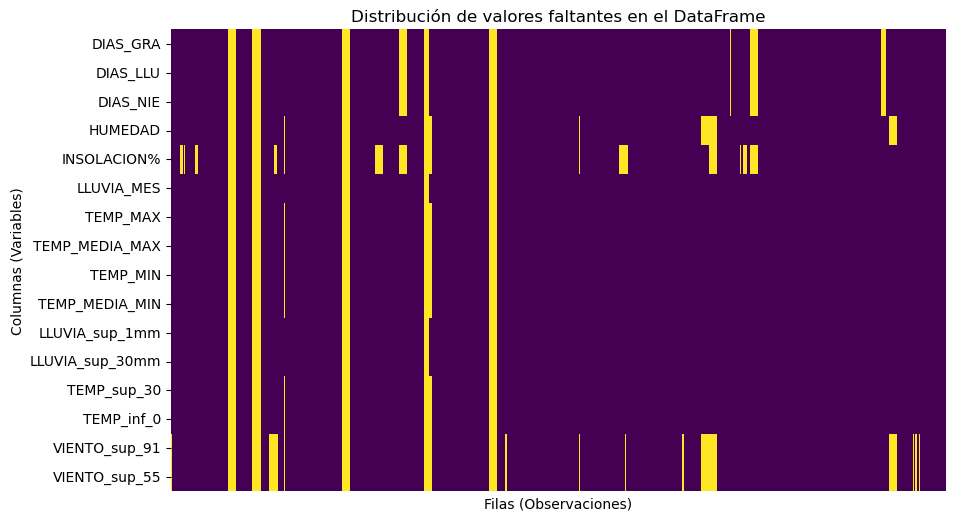

In [106]:
df_final_filtered = df_final.drop(columns=['INDICATIVO', 'AÑO', 'MES'])

valores_faltantes_por_fila = df_final_filtered.isna().sum(axis=1)

plt.figure(figsize=(10, 6))
sns.heatmap(df_final_filtered.T.isnull(), cmap='viridis', cbar=False, xticklabels=False)
plt.title('Distribución de valores faltantes en el DataFrame')
plt.xlabel('Filas (Observaciones)')
plt.ylabel('Columnas (Variables)');

In [107]:
df_final.isna().sum()

INDICATIVO            0
AÑO                   0
MES                   0
DIAS_GRA            708
DIAS_LLU            708
DIAS_NIE            708
HUMEDAD             792
INSOLACION%        1164
LLUVIA_MES          444
TEMP_MAX            492
TEMP_MEDIA_MAX      492
TEMP_MIN            492
TEMP_MEDIA_MIN      492
LLUVIA_sup_1mm      444
LLUVIA_sup_30mm     444
TEMP_sup_30         492
TEMP_inf_0          492
VIENTO_sup_91      1020
VIENTO_sup_55      1020
dtype: int64

# SUSTITUCIÓN DE VALORES NAN

In [108]:
copia_df=df_final.copy()
copia_df

,INDICATIVO,AÑO,MES,DIAS_GRA,DIAS_LLU,DIAS_NIE,HUMEDAD,INSOLACION%,LLUVIA_MES,TEMP_MAX,TEMP_MEDIA_MAX,TEMP_MIN,TEMP_MEDIA_MIN,LLUVIA_sup_1mm,LLUVIA_sup_30mm,TEMP_sup_30,TEMP_inf_0,VIENTO_sup_91,VIENTO_sup_55
0,1387,2016,1,0.0,25.0,0.0,79.0,23.0,292.0,20.5,14.6,3.7,9.5,20.0,1.0,0.0,0.0,NaN,NaN
1,1387,2016,2,2.0,20.0,0.0,80.0,25.0,201.6,16.9,13.3,3.9,8.7,18.0,1.0,0.0,0.0,NaN,NaN
2,1387,2016,3,0.0,20.0,0.0,76.0,44.0,196.5,17.1,13.9,4.1,8.2,17.0,2.0,0.0,0.0,NaN,NaN
3,1387,2016,4,0.0,18.0,0.0,77.0,0.0,122.4,20.0,15.0,5.0,9.1,15.0,0.0,0.0,0.0,NaN,NaN
4,1387,2016,5,0.0,20.0,0.0,79.0,0.0,89.8,25.2,18.4,7.4,12.1,15.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9115,9434,2023,8,0.0,2.0,0.0,0.0,86.0,0.0,41.7,34.3,15.6,20.7,0.0,0.0,24.0,0.0,0.0,9.0
9116,9434,2023,9,1.0,9.0,0.0,0.0,68.0,48.6,34.4,29.3,11.8,17.3,8.0,0.0,14.0,0.0,0.0,3.0
9117,9434,2023,10,0.0,13.0,0.0,0.0,61.0,41.6,33.9,25.6,9.8,14.8,7.0,0.0,7.0,0.0,0.0,3.0
9118,9434,2023,11,0.0,8.0,0.0,0.0,68.0,24.6,24.5,18.7,2.6,8.9,6.0,0.0,0.0,0.0,1.0,12.0


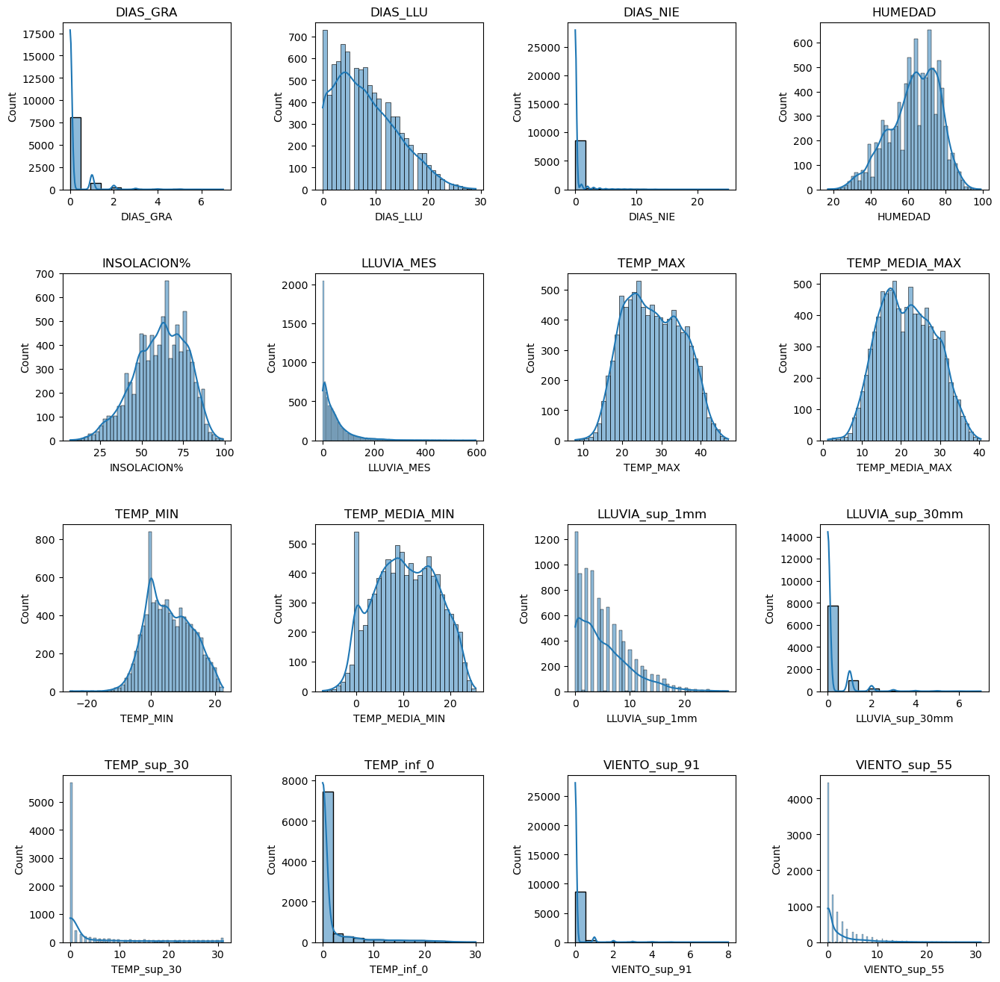

In [147]:
variables = copia_df.columns[3:]

fig, axs = plt.subplots(4, 4, figsize=(16, 16))
fig.subplots_adjust(hspace=0.5, wspace=0.5)  

for i, variable in enumerate(variables):
    row = i // 4
    col = i % 4
    sns.histplot(data=copia_df, x=variable, ax=axs[row, col], kde=True)
    axs[row, col].set_title(variable);  

In [110]:
medianas_temp_max = copia_df.groupby(['AÑO', 'MES'])['TEMP_MAX'].median()
medianas_temp_media_max = copia_df.groupby(['AÑO', 'MES'])['TEMP_MEDIA_MAX'].median()
medianas_humedad = copia_df.groupby(['AÑO', 'MES'])['HUMEDAD'].median()
medianas_insolacion = copia_df.groupby(['AÑO', 'MES'])['INSOLACION%'].median()

def reemplazar_por_mediana(row, col_name, medianas, reemplazar_ceros=False):
    valor = row[col_name]
    if pd.isnull(valor) or (reemplazar_ceros and (valor <= 0.0)):
        return medianas.loc[(row['AÑO'], row['MES'])]
    return valor

copia_df['TEMP_MAX'] = copia_df.apply(reemplazar_por_mediana, axis=1, args=('TEMP_MAX', medianas_temp_max, True))
copia_df['TEMP_MEDIA_MAX'] = copia_df.apply(reemplazar_por_mediana, axis=1, args=('TEMP_MEDIA_MAX', medianas_temp_media_max, True))
copia_df['HUMEDAD'] = copia_df.apply(reemplazar_por_mediana, axis=1, args=('HUMEDAD', medianas_humedad, True))
copia_df['INSOLACION%'] = copia_df.apply(reemplazar_por_mediana, axis=1, args=('INSOLACION%', medianas_insolacion, True))
copia_df

,INDICATIVO,AÑO,MES,DIAS_GRA,DIAS_LLU,DIAS_NIE,HUMEDAD,INSOLACION%,LLUVIA_MES,TEMP_MAX,TEMP_MEDIA_MAX,TEMP_MIN,TEMP_MEDIA_MIN,LLUVIA_sup_1mm,LLUVIA_sup_30mm,TEMP_sup_30,TEMP_inf_0,VIENTO_sup_91,VIENTO_sup_55
0,1387,2016,1,0.0,25.0,0.0,79.0,23.0,292.0,20.5,14.6,3.7,9.5,20.0,1.0,0.0,0.0,NaN,NaN
1,1387,2016,2,2.0,20.0,0.0,80.0,25.0,201.6,16.9,13.3,3.9,8.7,18.0,1.0,0.0,0.0,NaN,NaN
2,1387,2016,3,0.0,20.0,0.0,76.0,44.0,196.5,17.1,13.9,4.1,8.2,17.0,2.0,0.0,0.0,NaN,NaN
3,1387,2016,4,0.0,18.0,0.0,77.0,56.0,122.4,20.0,15.0,5.0,9.1,15.0,0.0,0.0,0.0,NaN,NaN
4,1387,2016,5,0.0,20.0,0.0,79.0,57.0,89.8,25.2,18.4,7.4,12.1,15.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9115,9434,2023,8,0.0,2.0,0.0,40.0,86.0,0.0,41.7,34.3,15.6,20.7,0.0,0.0,24.0,0.0,0.0,9.0
9116,9434,2023,9,1.0,9.0,0.0,61.0,68.0,48.6,34.4,29.3,11.8,17.3,8.0,0.0,14.0,0.0,0.0,3.0
9117,9434,2023,10,0.0,13.0,0.0,64.5,61.0,41.6,33.9,25.6,9.8,14.8,7.0,0.0,7.0,0.0,0.0,3.0
9118,9434,2023,11,0.0,8.0,0.0,70.5,68.0,24.6,24.5,18.7,2.6,8.9,6.0,0.0,0.0,0.0,1.0,12.0


In [111]:
copia_df['TEMP_MEDIA_MAX'].describe()

count    9120.000000
mean       21.601436
std         6.985253
min         1.300000
25%        16.100000
50%        21.400000
75%        27.000000
max        40.400000
Name: TEMP_MEDIA_MAX, dtype: float64

In [112]:
df_final['TEMP_MEDIA_MAX'].describe()

count    8628.000000
mean       20.627828
std         8.210759
min        -0.200000
25%        15.500000
50%        20.900000
75%        26.600000
max        40.400000
Name: TEMP_MEDIA_MAX, dtype: float64

In [113]:
medianas_temp_min = copia_df.groupby(['AÑO', 'MES'])['TEMP_MIN'].median()
medianas_temp_media_min = copia_df.groupby(['AÑO', 'MES'])['TEMP_MEDIA_MIN'].median()
medianas_dias_gra = copia_df.groupby(['AÑO', 'MES'])['DIAS_GRA'].median()
medianas_dias_llu = copia_df.groupby(['AÑO', 'MES'])['DIAS_LLU'].median()
medianas_dias_nie = copia_df.groupby(['AÑO', 'MES'])['DIAS_NIE'].median()
medianas_temp_sup_30 = copia_df.groupby(['AÑO', 'MES'])['TEMP_sup_30'].median()
medianas_temp_inf_0 = copia_df.groupby(['AÑO', 'MES'])['TEMP_inf_0'].median()
medianas_viento_sup_91 = copia_df.groupby(['AÑO', 'MES'])['VIENTO_sup_91'].median()
medianas_viento_sup_55 = copia_df.groupby(['AÑO', 'MES'])['VIENTO_sup_55'].median()
medianas_lluvia_mes = copia_df.groupby(['AÑO', 'MES'])['LLUVIA_MES'].median()
medianas_lluvia_sup1 = copia_df.groupby(['AÑO', 'MES'])['LLUVIA_sup_1mm'].median()
medianas_lluvia_sup30 = copia_df.groupby(['AÑO', 'MES'])['LLUVIA_sup_30mm'].median()

def reemplazar_nan_por_mediana(row, col_name, medianas):
    valor = row[col_name]
    if pd.isnull(valor):
        return medianas.loc[(row['AÑO'], row['MES'])]
    return valor

copia_df['TEMP_MIN'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('TEMP_MIN', medianas_temp_min))
copia_df['TEMP_MEDIA_MIN'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('TEMP_MEDIA_MIN', medianas_temp_media_min))
copia_df['DIAS_GRA'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('DIAS_GRA', medianas_dias_gra))
copia_df['DIAS_LLU'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('DIAS_LLU', medianas_dias_llu))
copia_df['DIAS_NIE'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('DIAS_NIE', medianas_dias_nie))
copia_df['TEMP_sup_30'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('TEMP_sup_30', medianas_temp_sup_30))
copia_df['TEMP_inf_0'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('TEMP_inf_0', medianas_temp_inf_0))
copia_df['VIENTO_sup_91'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('VIENTO_sup_91', medianas_viento_sup_91))
copia_df['VIENTO_sup_55'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('VIENTO_sup_55', medianas_viento_sup_55))
copia_df['LLUVIA_MES'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('LLUVIA_MES', medianas_lluvia_mes))
copia_df['LLUVIA_sup_1mm'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('LLUVIA_sup_1mm', medianas_lluvia_sup1))
copia_df['LLUVIA_sup_30mm'] = copia_df.apply(reemplazar_nan_por_mediana, axis=1, args=('LLUVIA_sup_30mm', medianas_lluvia_sup30))
copia_df

,INDICATIVO,AÑO,MES,DIAS_GRA,DIAS_LLU,DIAS_NIE,HUMEDAD,INSOLACION%,LLUVIA_MES,TEMP_MAX,TEMP_MEDIA_MAX,TEMP_MIN,TEMP_MEDIA_MIN,LLUVIA_sup_1mm,LLUVIA_sup_30mm,TEMP_sup_30,TEMP_inf_0,VIENTO_sup_91,VIENTO_sup_55
0,1387,2016,1,0.0,25.0,0.0,79.0,23.0,292.0,20.5,14.6,3.7,9.5,20.0,1.0,0.0,0.0,0.0,3.0
1,1387,2016,2,2.0,20.0,0.0,80.0,25.0,201.6,16.9,13.3,3.9,8.7,18.0,1.0,0.0,0.0,0.0,5.0
2,1387,2016,3,0.0,20.0,0.0,76.0,44.0,196.5,17.1,13.9,4.1,8.2,17.0,2.0,0.0,0.0,0.0,2.0
3,1387,2016,4,0.0,18.0,0.0,77.0,56.0,122.4,20.0,15.0,5.0,9.1,15.0,0.0,0.0,0.0,0.0,1.0
4,1387,2016,5,0.0,20.0,0.0,79.0,57.0,89.8,25.2,18.4,7.4,12.1,15.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9115,9434,2023,8,0.0,2.0,0.0,40.0,86.0,0.0,41.7,34.3,15.6,20.7,0.0,0.0,24.0,0.0,0.0,9.0
9116,9434,2023,9,1.0,9.0,0.0,61.0,68.0,48.6,34.4,29.3,11.8,17.3,8.0,0.0,14.0,0.0,0.0,3.0
9117,9434,2023,10,0.0,13.0,0.0,64.5,61.0,41.6,33.9,25.6,9.8,14.8,7.0,0.0,7.0,0.0,0.0,3.0
9118,9434,2023,11,0.0,8.0,0.0,70.5,68.0,24.6,24.5,18.7,2.6,8.9,6.0,0.0,0.0,0.0,1.0,12.0


In [114]:
copia_df.isnull().sum()

INDICATIVO         0
AÑO                0
MES                0
DIAS_GRA           0
DIAS_LLU           0
DIAS_NIE           0
HUMEDAD            0
INSOLACION%        0
LLUVIA_MES         0
TEMP_MAX           0
TEMP_MEDIA_MAX     0
TEMP_MIN           0
TEMP_MEDIA_MIN     0
LLUVIA_sup_1mm     0
LLUVIA_sup_30mm    0
TEMP_sup_30        0
TEMP_inf_0         0
VIENTO_sup_91      0
VIENTO_sup_55      0
dtype: int64

In [115]:
copia_df.duplicated().sum()

0

In [116]:
copia_df['TEMP_MEDIA_MIN'].describe()

count    9120.000000
mean       10.528377
std         6.506311
min        -7.100000
25%         5.500000
50%        10.400000
75%        15.700000
max        25.400000
Name: TEMP_MEDIA_MIN, dtype: float64

In [117]:
df_final['TEMP_MEDIA_MIN'].describe()

count    8628.000000
mean       10.519576
std         6.573522
min        -7.100000
25%         5.500000
50%        10.400000
75%        15.800000
max        25.400000
Name: TEMP_MEDIA_MIN, dtype: float64

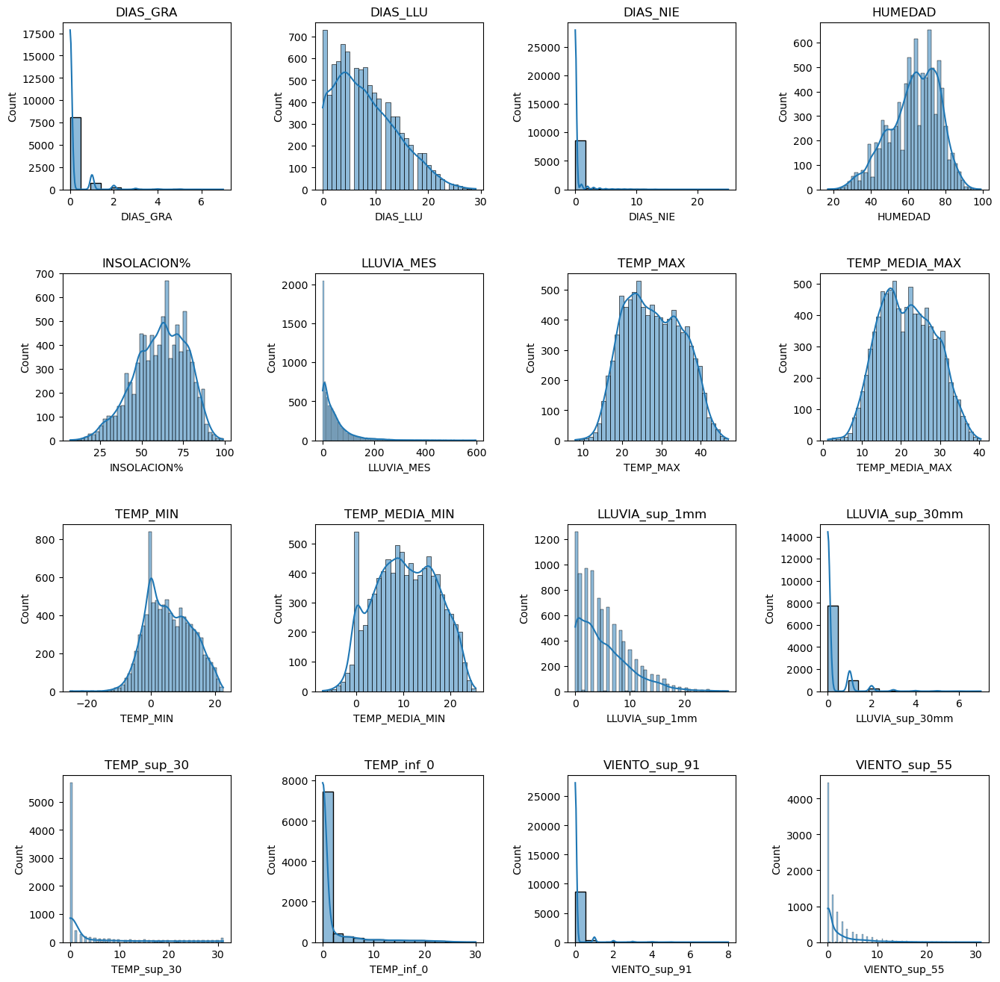

In [118]:
variables = copia_df.columns[3:]

fig, axs = plt.subplots(4, 4, figsize=(16, 16))
fig.subplots_adjust(hspace=0.5, wspace=0.5)  

for i, variable in enumerate(variables):
    row = i // 4
    col = i % 4
    sns.histplot(data=copia_df, x=variable, ax=axs[row, col], kde=True)
    axs[row, col].set_title(variable);

# BÚSQUEDA DE LA *VARIABLE OBJETIVO*. 

## *'LLUVIA_MES'*, *'TEMP_MAX'* Y *'TEMP_MEDIA_MAX'*

## LLUVIA_MES

In [119]:
lluvia_por_estacion_año_mes = df_final.groupby(['INDICATIVO', 'AÑO', 'MES'])['LLUVIA_MES'].sum()

df_lluvia_por_estacion_año_mes = lluvia_por_estacion_año_mes.reset_index()
df_lluvia_por_estacion_año_mes

,INDICATIVO,AÑO,MES,LLUVIA_MES
0,0016A,2016,1,1.1
1,0016A,2016,2,40.8
2,0016A,2016,3,63.5
3,0016A,2016,4,51.3
4,0016A,2016,5,25.7
...,...,...,...,...
9115,C929I,2023,8,3.8
9116,C929I,2023,9,0.4
9117,C929I,2023,10,9.7
9118,C929I,2023,11,15.6


In [120]:
lluvia_por_estacion_año = df_lluvia_por_estacion_año_mes.groupby(['INDICATIVO', 'AÑO'])['LLUVIA_MES'].sum()

df_lluvia_por_estacion_año = lluvia_por_estacion_año.reset_index()

df_lluvia_por_estacion_año

,INDICATIVO,AÑO,LLUVIA_MES
0,0016A,2016,406.9
1,0016A,2017,249.4
2,0016A,2018,708.1
3,0016A,2019,341.4
4,0016A,2020,500.3
...,...,...,...
755,C929I,2019,84.3
756,C929I,2020,110.1
757,C929I,2021,66.0
758,C929I,2022,233.1


In [121]:
lluvia_por_año = df_lluvia_por_estacion_año_mes.groupby('AÑO')['LLUVIA_MES'].sum()

df_lluvia_por_año = lluvia_por_año.reset_index()

df_lluvia_por_año

,AÑO,LLUVIA_MES
0,2016,52205.6
1,2017,38898.4
2,2018,62329.9
3,2019,49494.4
4,2020,51214.6
5,2021,51107.1
6,2022,48373.9
7,2023,44587.0


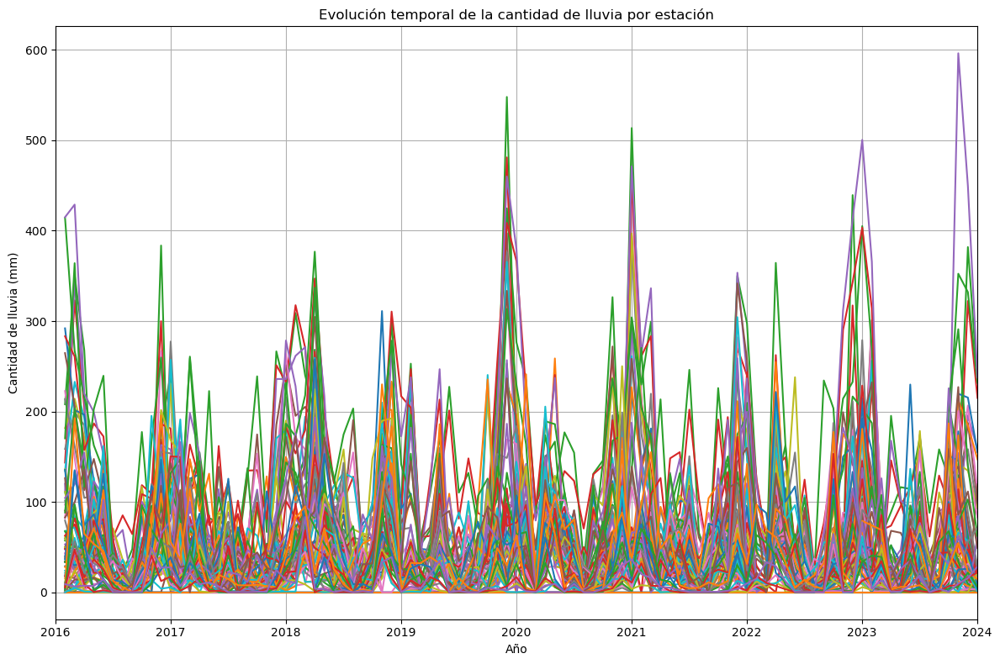

In [122]:
plt.figure(figsize=(12, 8))

for estacion in df_lluvia_por_estacion_año_mes['INDICATIVO'].unique():
    datos_estacion = df_lluvia_por_estacion_año_mes[df_lluvia_por_estacion_año_mes['INDICATIVO'] == estacion]

    plt.plot(datos_estacion['AÑO'] + datos_estacion['MES'] / 12, datos_estacion['LLUVIA_MES'], label=estacion)

plt.title('Evolución temporal de la cantidad de lluvia por estación')
plt.xlabel('Año')
plt.ylabel('Cantidad de lluvia (mm)')

plt.xlim(2016, 2024)

plt.grid(True)
plt.tight_layout();

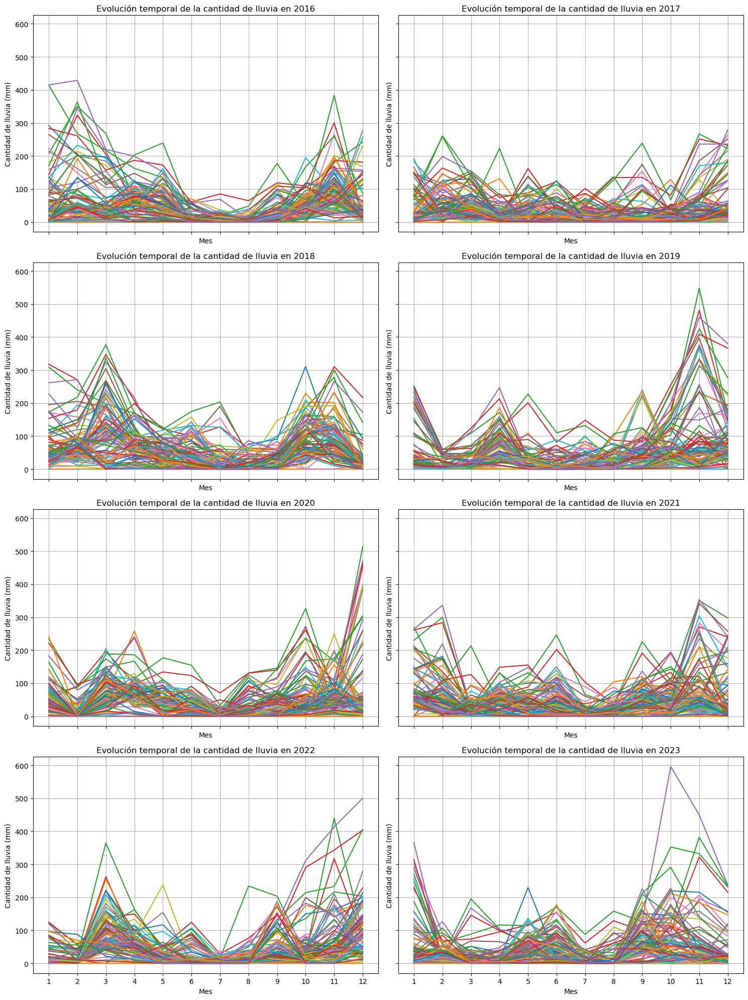

In [123]:
años = df_lluvia_por_estacion_año_mes['AÑO'].unique()

min_lluvia = df_lluvia_por_estacion_año_mes['LLUVIA_MES'].min()
max_lluvia = df_lluvia_por_estacion_año_mes['LLUVIA_MES'].max()

fig, axs = plt.subplots(4, 2, figsize=(15, 20), sharex=True, sharey=True)

for i, año in enumerate(años):
    fila = i // 2
    columna = i % 2

    datos_año = df_lluvia_por_estacion_año_mes[df_lluvia_por_estacion_año_mes['AÑO'] == año]

    for estacion in datos_año['INDICATIVO'].unique():
        datos_estacion = datos_año[datos_año['INDICATIVO'] == estacion]
 
        axs[fila, columna].plot(datos_estacion['MES'], datos_estacion['LLUVIA_MES'], label=estacion)

    axs[fila, columna].set_title(f'Evolución temporal de la cantidad de lluvia en {año}')
    axs[fila, columna].set_xlabel('Mes')
    axs[fila, columna].set_ylabel('Cantidad de lluvia (mm)')
    axs[fila, columna].grid(True)

    axs[fila, columna].set_xticks(range(1, 13))

plt.tight_layout();

## TEMP_MAX

In [124]:
temp_max_por_estacion_año_mes = copia_df.groupby(['INDICATIVO', 'AÑO', 'MES'])['TEMP_MAX'].sum()

df_temp_max_por_estacion_año_mes = temp_max_por_estacion_año_mes.reset_index()
df_temp_max_por_estacion_año_mes

,INDICATIVO,AÑO,MES,TEMP_MAX
0,0016A,2016,1,24.2
1,0016A,2016,2,23.8
2,0016A,2016,3,24.6
3,0016A,2016,4,26.1
4,0016A,2016,5,29.4
...,...,...,...,...
9115,C929I,2023,8,33.5
9116,C929I,2023,9,29.2
9117,C929I,2023,10,35.4
9118,C929I,2023,11,32.4


In [125]:
temp_por_estacion_año = df_temp_max_por_estacion_año_mes.groupby(['INDICATIVO', 'AÑO'])['TEMP_MAX'].sum()

df_temp_por_estacion_año = temp_por_estacion_año.reset_index()

df_temp_por_estacion_año

,INDICATIVO,AÑO,TEMP_MAX
0,0016A,2016,342.05
1,0016A,2017,328.20
2,0016A,2018,330.10
3,0016A,2019,332.80
4,0016A,2020,330.20
...,...,...,...
755,C929I,2019,303.15
756,C929I,2020,337.90
757,C929I,2021,327.80
758,C929I,2022,324.10


In [126]:
temp_por_año = df_temp_max_por_estacion_año_mes.groupby('AÑO')['TEMP_MAX'].sum()

df_temp_por_año = temp_por_año.reset_index()

df_temp_por_año

,AÑO,TEMP_MAX
0,2016,31306.65
1,2017,32226.70
2,2018,30496.35
3,2019,31756.15
4,2020,31831.90
5,2021,31478.35
6,2022,32586.65
7,2023,32910.80


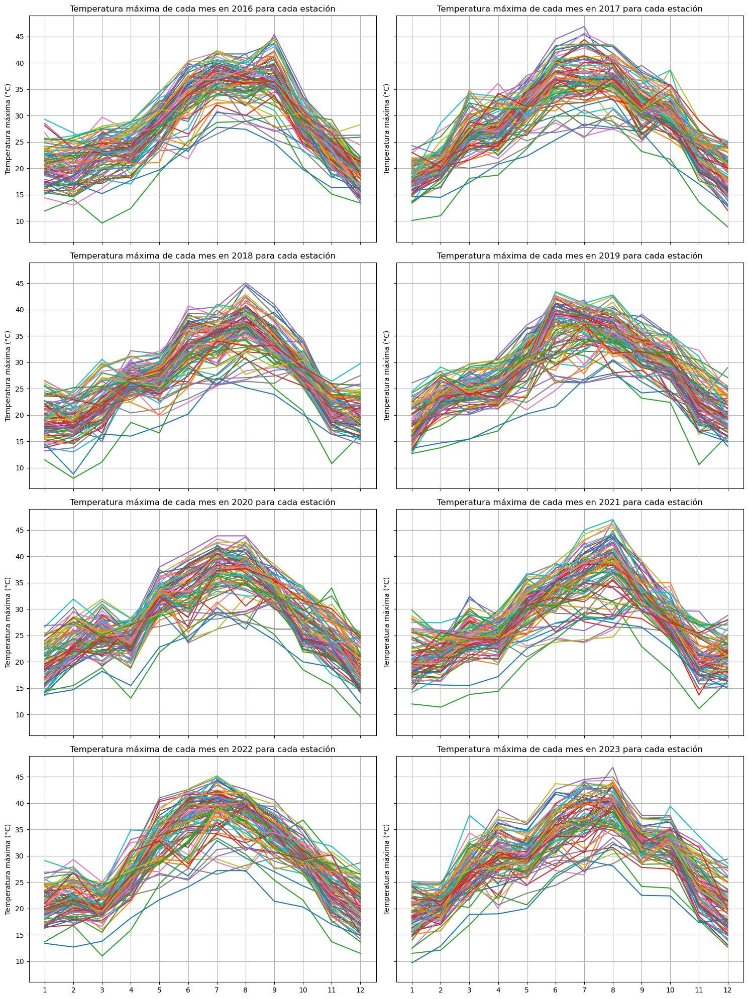

In [127]:
años = df_temp_max_por_estacion_año_mes['AÑO'].unique()
min_temp_max = df_temp_max_por_estacion_año_mes['TEMP_MAX'].min()
max_temp_max = df_temp_max_por_estacion_año_mes['TEMP_MAX'].max()

fig, axs = plt.subplots(4, 2, figsize=(15, 20), sharex=True, sharey=True)

for i, año in enumerate(años):
    fila = i // 2
    columna = i % 2

    datos_año = df_temp_max_por_estacion_año_mes[df_temp_max_por_estacion_año_mes['AÑO'] == año]

    for estacion in datos_año['INDICATIVO'].unique():
        datos_estacion = datos_año[datos_año['INDICATIVO'] == estacion]

        axs[fila, columna].plot(datos_estacion['MES'], datos_estacion['TEMP_MAX'], label=estacion)

    axs[fila, columna].set_title(f'Temperatura máxima de cada mes en {año} para cada estación')
    axs[fila, columna].set_ylabel('Temperatura máxima (°C)')
    axs[fila, columna].grid(True)
    axs[fila, columna].set_xticks(range(1, 13))

plt.tight_layout();

## TEMP_MEDIA_MAX

In [128]:
temp_med_max_por_estacion_año_mes = copia_df.groupby(['INDICATIVO', 'AÑO', 'MES'])['TEMP_MEDIA_MAX'].sum()

df_temp_med_max_por_estacion_año_mes = temp_med_max_por_estacion_año_mes.reset_index()
df_temp_med_max_por_estacion_año_mes

,INDICATIVO,AÑO,MES,TEMP_MEDIA_MAX
0,0016A,2016,1,17.0
1,0016A,2016,2,18.2
2,0016A,2016,3,18.6
3,0016A,2016,4,20.9
4,0016A,2016,5,24.4
...,...,...,...,...
9115,C929I,2023,8,27.7
9116,C929I,2023,9,27.1
9117,C929I,2023,10,29.7
9118,C929I,2023,11,25.4


In [129]:
temp_med_por_estacion_año = df_temp_med_max_por_estacion_año_mes.groupby(['INDICATIVO', 'AÑO'])['TEMP_MEDIA_MAX'].sum()

df_temp_med_por_estacion_año = temp_med_por_estacion_año.reset_index()

df_temp_med_por_estacion_año

,INDICATIVO,AÑO,TEMP_MEDIA_MAX
0,0016A,2016,273.80
1,0016A,2017,271.40
2,0016A,2018,271.50
3,0016A,2019,271.30
4,0016A,2020,271.20
...,...,...,...
755,C929I,2019,270.85
756,C929I,2020,286.50
757,C929I,2021,281.30
758,C929I,2022,284.30


In [130]:
temp_med_por_año = df_temp_med_max_por_estacion_año_mes.groupby('AÑO')['TEMP_MEDIA_MAX'].sum()

df_temp_med_por_año = temp_med_por_año.reset_index()

df_temp_med_por_año

,AÑO,TEMP_MEDIA_MAX
0,2016,24181.75
1,2017,25067.80
2,2018,23643.10
3,2019,24426.80
4,2020,24665.10
5,2021,23966.10
6,2022,25525.65
7,2023,25528.80


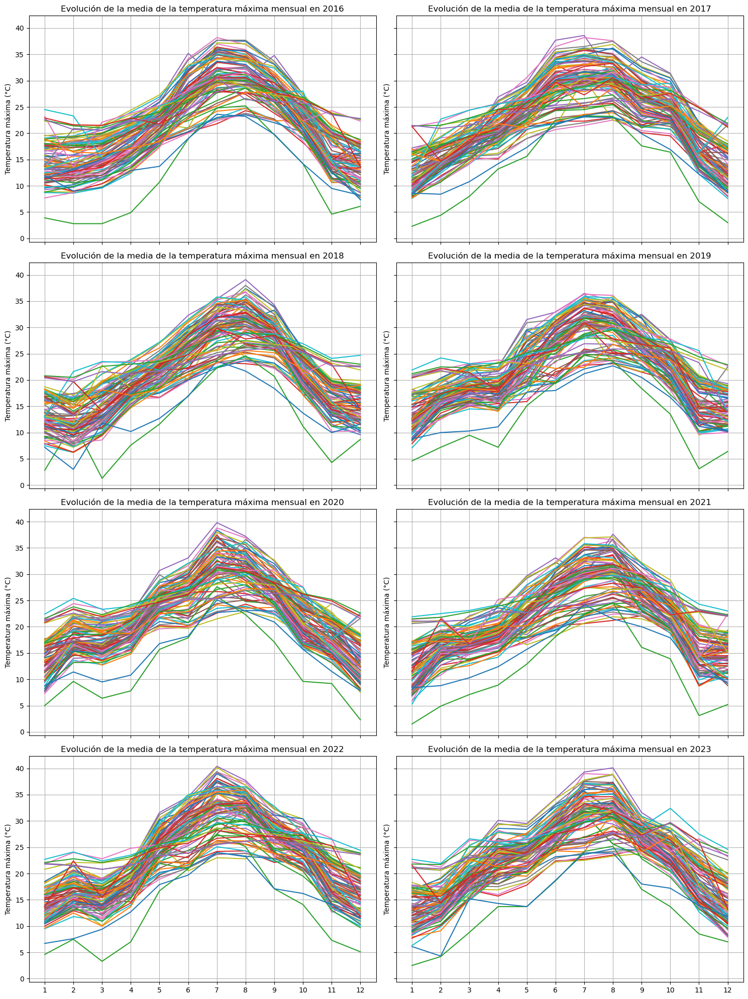

In [131]:
años = df_temp_med_max_por_estacion_año_mes['AÑO'].unique()

min_temp_med_max = df_temp_med_max_por_estacion_año_mes['TEMP_MEDIA_MAX'].min()
max_temp_med_max = df_temp_med_max_por_estacion_año_mes['TEMP_MEDIA_MAX'].max()

fig, axs = plt.subplots(4, 2, figsize=(15, 20), sharex=True, sharey=True)

for i, año in enumerate(años):
    fila = i // 2
    columna = i % 2

    datos_año = df_temp_med_max_por_estacion_año_mes[df_temp_med_max_por_estacion_año_mes['AÑO'] == año]

    for estacion in datos_año['INDICATIVO'].unique():
        datos_estacion = datos_año[datos_año['INDICATIVO'] == estacion]

        axs[fila, columna].plot(datos_estacion['MES'], datos_estacion['TEMP_MEDIA_MAX'], label=estacion)

    axs[fila, columna].set_title(f'Evolución de la media de la temperatura máxima mensual en {año}')
    axs[fila, columna].set_ylabel('Temperatura máxima (°C)')
    axs[fila, columna].grid(True)
    axs[fila, columna].set_xticks(range(1, 13))


plt.tight_layout();

# TRANSFORMACIONES

# OUTLIERS

In [171]:
trans_df = copia_df.copy()
trans_df

,INDICATIVO,AÑO,MES,DIAS_GRA,DIAS_LLU,DIAS_NIE,HUMEDAD,INSOLACION%,LLUVIA_MES,TEMP_MAX,TEMP_MEDIA_MAX,TEMP_MIN,TEMP_MEDIA_MIN,LLUVIA_sup_1mm,LLUVIA_sup_30mm,TEMP_sup_30,TEMP_inf_0,VIENTO_sup_91,VIENTO_sup_55
0,1387,2016,1,0.0,25.0,0.0,79.0,23.0,292.0,20.5,14.6,3.7,9.5,20.0,1.0,0.0,0.0,0.0,3.0
1,1387,2016,2,2.0,20.0,0.0,80.0,25.0,201.6,16.9,13.3,3.9,8.7,18.0,1.0,0.0,0.0,0.0,5.0
2,1387,2016,3,0.0,20.0,0.0,76.0,44.0,196.5,17.1,13.9,4.1,8.2,17.0,2.0,0.0,0.0,0.0,2.0
3,1387,2016,4,0.0,18.0,0.0,77.0,56.0,122.4,20.0,15.0,5.0,9.1,15.0,0.0,0.0,0.0,0.0,1.0
4,1387,2016,5,0.0,20.0,0.0,79.0,57.0,89.8,25.2,18.4,7.4,12.1,15.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9115,9434,2023,8,0.0,2.0,0.0,40.0,86.0,0.0,41.7,34.3,15.6,20.7,0.0,0.0,24.0,0.0,0.0,9.0
9116,9434,2023,9,1.0,9.0,0.0,61.0,68.0,48.6,34.4,29.3,11.8,17.3,8.0,0.0,14.0,0.0,0.0,3.0
9117,9434,2023,10,0.0,13.0,0.0,64.5,61.0,41.6,33.9,25.6,9.8,14.8,7.0,0.0,7.0,0.0,0.0,3.0
9118,9434,2023,11,0.0,8.0,0.0,70.5,68.0,24.6,24.5,18.7,2.6,8.9,6.0,0.0,0.0,0.0,1.0,12.0


Para las transformaciones y posterior modelado, vuelvo a crear la fecha en formato datetime, la convierto en el inidce del df y elimino las columnas originales 'AÑO' y 'MES'

In [172]:
trans_df['FECHA'] = pd.to_datetime(trans_df['AÑO'].astype(str) + '-' + trans_df['MES'].astype(str), format='%Y-%m')
trans_df.set_index('FECHA', inplace=True)
trans_df.drop(columns=['AÑO', 'MES'], inplace=True)
trans_df

,INDICATIVO,DIAS_GRA,DIAS_LLU,DIAS_NIE,HUMEDAD,INSOLACION%,LLUVIA_MES,TEMP_MAX,TEMP_MEDIA_MAX,TEMP_MIN,TEMP_MEDIA_MIN,LLUVIA_sup_1mm,LLUVIA_sup_30mm,TEMP_sup_30,TEMP_inf_0,VIENTO_sup_91,VIENTO_sup_55
FECHA,,,,,,,,,,,,,,,,,
2016-01-01,1387,0.0,25.0,0.0,79.0,23.0,292.0,20.5,14.6,3.7,9.5,20.0,1.0,0.0,0.0,0.0,3.0
2016-02-01,1387,2.0,20.0,0.0,80.0,25.0,201.6,16.9,13.3,3.9,8.7,18.0,1.0,0.0,0.0,0.0,5.0
2016-03-01,1387,0.0,20.0,0.0,76.0,44.0,196.5,17.1,13.9,4.1,8.2,17.0,2.0,0.0,0.0,0.0,2.0
2016-04-01,1387,0.0,18.0,0.0,77.0,56.0,122.4,20.0,15.0,5.0,9.1,15.0,0.0,0.0,0.0,0.0,1.0
2016-05-01,1387,0.0,20.0,0.0,79.0,57.0,89.8,25.2,18.4,7.4,12.1,15.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-01,9434,0.0,2.0,0.0,40.0,86.0,0.0,41.7,34.3,15.6,20.7,0.0,0.0,24.0,0.0,0.0,9.0
2023-09-01,9434,1.0,9.0,0.0,61.0,68.0,48.6,34.4,29.3,11.8,17.3,8.0,0.0,14.0,0.0,0.0,3.0
2023-10-01,9434,0.0,13.0,0.0,64.5,61.0,41.6,33.9,25.6,9.8,14.8,7.0,0.0,7.0,0.0,0.0,3.0


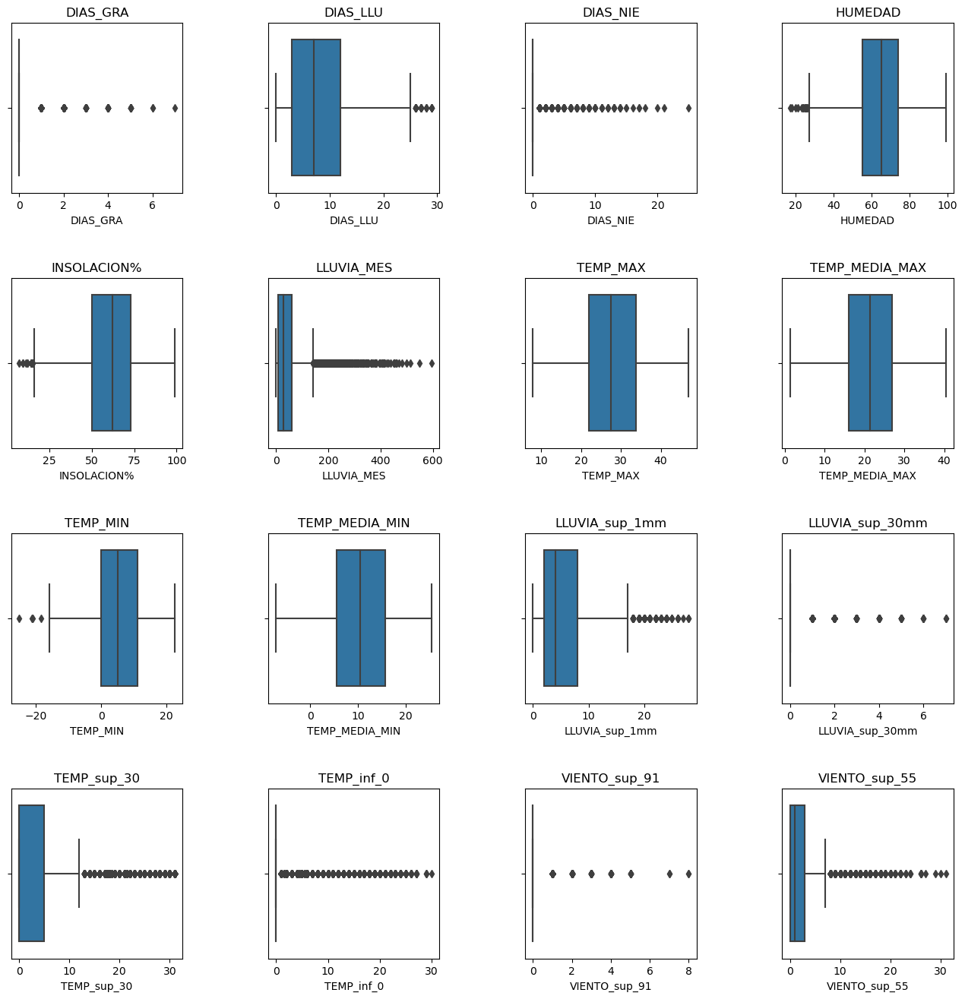

In [153]:
variables_outliers = trans_df.columns[1:]

fig, axs = plt.subplots(4, 4, figsize=(16, 16))
fig.subplots_adjust(hspace=0.5, wspace=0.5) 

for i, variable in enumerate(variables_outliers):
    row = i // 4
    col = i % 4
    sns.boxplot(x=trans_df[variable], ax=axs[row, col])
    axs[row, col].set_title(variable);

In [154]:
outliers = {}

for col in variables_outliers:
    Q1 = trans_df[col].quantile(0.25)
    Q3 = trans_df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers[col] = trans_df[(trans_df[col] < lower_bound) | (trans_df[col] > upper_bound)][col]

total_rows = len(trans_df)
for col, outlier_data in outliers.items():
    num_outliers = len(outlier_data)
    percentage_outliers = (num_outliers / total_rows) * 100
    print(f"{col}: {num_outliers} outliers ({percentage_outliers:.2f}%)")

DIAS_GRA: 1030 outliers (11.29%)
DIAS_LLU: 30 outliers (0.33%)
DIAS_NIE: 749 outliers (8.21%)
HUMEDAD: 23 outliers (0.25%)
INSOLACION%: 13 outliers (0.14%)
LLUVIA_MES: 568 outliers (6.23%)
TEMP_MAX: 0 outliers (0.00%)
TEMP_MEDIA_MAX: 0 outliers (0.00%)
TEMP_MIN: 4 outliers (0.04%)
TEMP_MEDIA_MIN: 0 outliers (0.00%)
LLUVIA_sup_1mm: 168 outliers (1.84%)
LLUVIA_sup_30mm: 1385 outliers (15.19%)
TEMP_sup_30: 1463 outliers (16.04%)
TEMP_inf_0: 2027 outliers (22.23%)
VIENTO_sup_91: 423 outliers (4.64%)
VIENTO_sup_55: 784 outliers (8.60%)


In [155]:
arcsinh_df = trans_df.copy()

for col in arcsinh_df.select_dtypes(include=['float64', 'int64']).columns:
    arcsinh_df[col] = np.arcsinh(arcsinh_df[col])

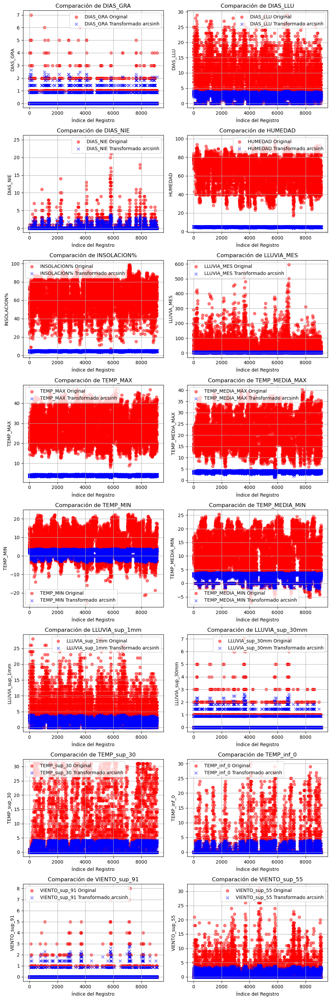

In [157]:
fig, axes = plt.subplots(8, 2, figsize=(10, 30))

axes = axes.flatten()

for i, var in enumerate(variables_outliers):
    ax = axes[i]
 
    ax.scatter(range(len(trans_df)), trans_df[var], color='red', label=f'{var} Original', alpha=0.5)
    
    ax.scatter(range(len(arcsinh_df)), arcsinh_df[var], color='blue', marker='x', label=f'{var} Transformado arcsinh', alpha=0.5)

    ax.set_title(f'Comparación de {var}')
    ax.set_xlabel('Índice del Registro')
    ax.set_ylabel(f'{var}')
    ax.legend()
    ax.grid(True)

if len(variables_outliers) < 16:
    for j in range(len(variables_outliers), 16):
        fig.delaxes(axes[j])

plt.tight_layout();

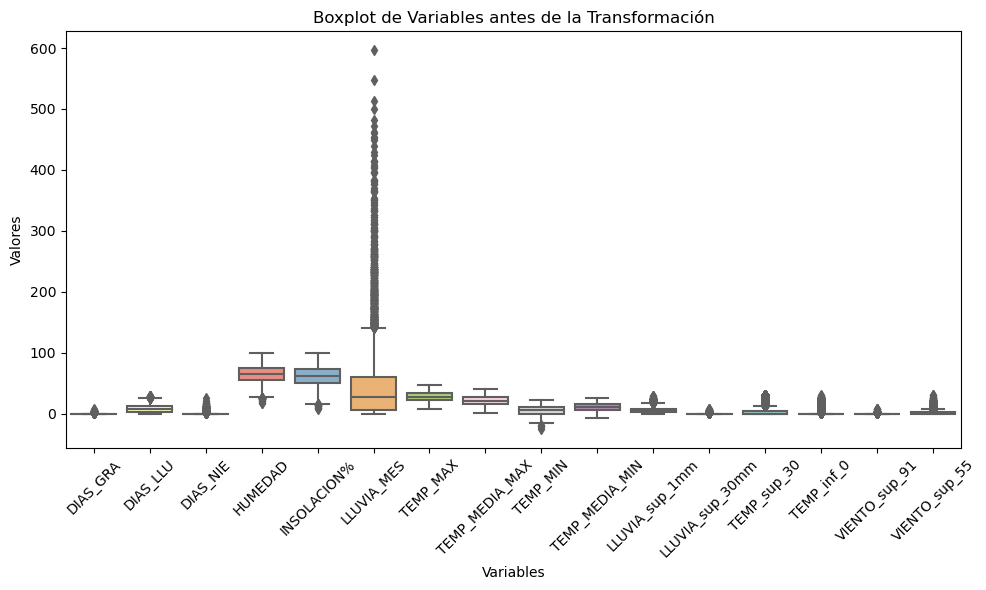

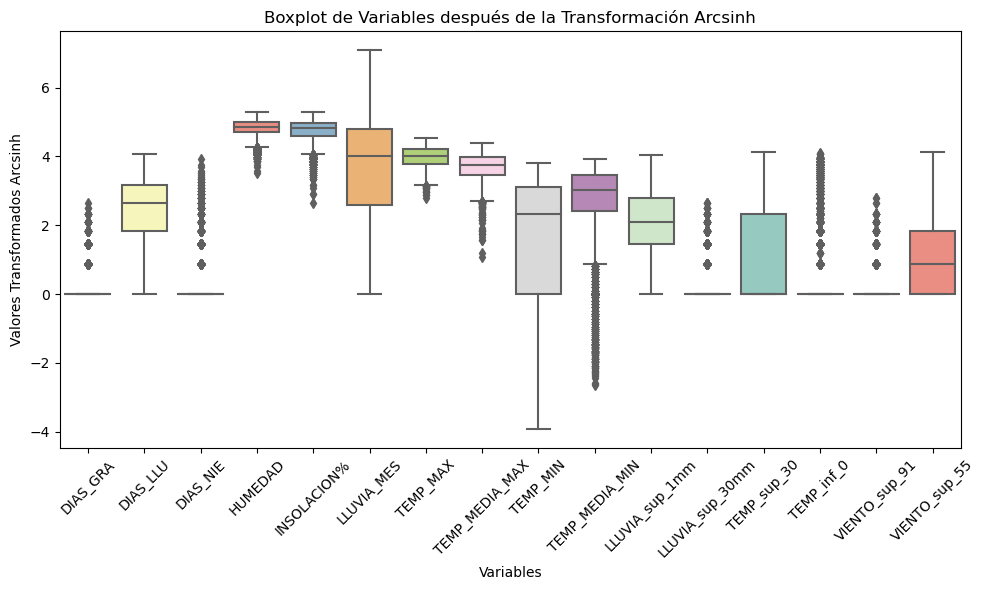

In [158]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=trans_df[variables_outliers], palette='Set3')
plt.title('Boxplot de Variables antes de la Transformación')
plt.xlabel('Variables')
plt.ylabel('Valores')
plt.xticks(rotation=45)
plt.tight_layout()

plt.figure(figsize=(10, 6))
sns.boxplot(data=arcsinh_df[variables_outliers], palette='Set3')
plt.title('Boxplot de Variables después de la Transformación Arcsinh')
plt.xlabel('Variables')
plt.ylabel('Valores Transformados Arcsinh')
plt.xticks(rotation=45)
plt.tight_layout()

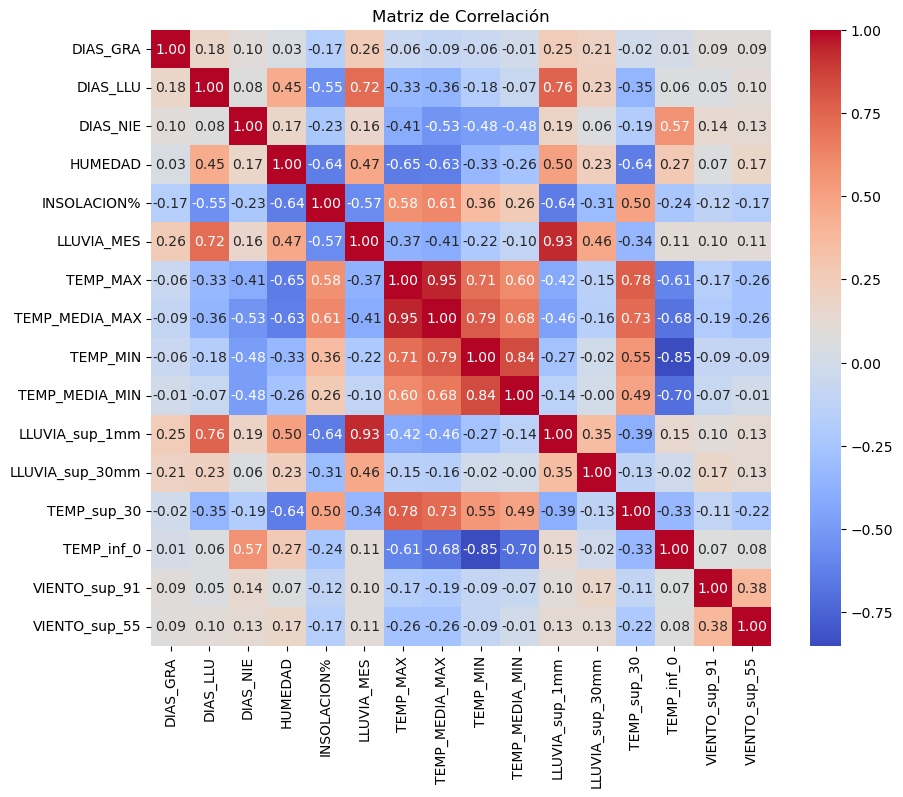

In [159]:
correlation_matrix = arcsinh_df.corr(numeric_only=True)

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlación');

Para crear la serie temporal, verifico si todas las fechas están presentes en todos los indicativos. 

In [136]:
for indicativo, grupo in trans_df.groupby('INDICATIVO'):
   
    fechas_esperadas = pd.date_range(start='2016-01-01', end='2023-12-31', freq='MS')

    fechas_presentes = grupo.index.unique()
    
    if set(fechas_esperadas) == set(fechas_presentes):
        print(f"Indicativo {indicativo}: Todas las fechas están presentes")
    else:
        fechas_faltantes = fechas_esperadas.difference(fechas_presentes)
        print(f"Indicativo {indicativo}: Faltan las siguientes fechas: {fechas_faltantes}")

Indicativo 0016A: Todas las fechas están presentes
Indicativo 0200E: Todas las fechas están presentes
Indicativo 1014: Todas las fechas están presentes
Indicativo 1024E: Todas las fechas están presentes
Indicativo 1082: Todas las fechas están presentes
Indicativo 1109: Todas las fechas están presentes
Indicativo 1111: Todas las fechas están presentes
Indicativo 1208H: Todas las fechas están presentes
Indicativo 1212E: Todas las fechas están presentes
Indicativo 1249I: Todas las fechas están presentes
Indicativo 1387: Todas las fechas están presentes
Indicativo 1387E: Todas las fechas están presentes
Indicativo 1428: Todas las fechas están presentes
Indicativo 1484C: Todas las fechas están presentes
Indicativo 1495: Todas las fechas están presentes
Indicativo 1505: Todas las fechas están presentes
Indicativo 1549: Todas las fechas están presentes
Indicativo 1690A: Todas las fechas están presentes
Indicativo 2030: Todas las fechas están presentes
Indicativo 2331: Todas las fechas están p

Una vez comprobado que todas las fechas están presentes en todos los indicativos, creo la serie temporal con la variable objetivo y realizo unas pruebas para inspeccionar sus características. 

In [160]:
serie_temporal = arcsinh_df['TEMP_MEDIA_MAX']

resultado_adf = adfuller(serie_temporal)
print('Prueba ADF:')
print('Estadístico ADF:', resultado_adf[0])
print('p-valor:', resultado_adf[1])

resultado_kpss = kpss(serie_temporal)
print('\nPrueba KPSS:')
print('Estadístico KPSS:', resultado_kpss[0])
print('p-valor:', resultado_kpss[1])

resultado_descomposicion = seasonal_decompose(serie_temporal, model='additive', period=12)  

residual = resultado_descomposicion.resid

tendencia_estadisticas = resultado_descomposicion.trend.describe()
estacionalidad_estadisticas = resultado_descomposicion.seasonal.describe()
residuales_estadisticas = resultado_descomposicion.resid.describe()

print("Estadísticas de la Tendencia:")
print(tendencia_estadisticas)

print("\nEstadísticas de la Estacionalidad:")
print(estacionalidad_estadisticas)

print("\nEstadísticas de los Residuales:")
print(residuales_estadisticas)

Prueba ADF:
Estadístico ADF: -7.650606707653667
p-valor: 1.7935468147602046e-11

Prueba KPSS:
Estadístico KPSS: 0.038797626330850606
p-valor: 0.1
Estadísticas de la Tendencia:
count    9108.000000
mean        3.707904
std         0.144970
min         2.822564
25%         3.618862
50%         3.715973
75%         3.814840
max         3.989233
Name: trend, dtype: float64

Estadísticas de la Estacionalidad:
count    9.120000e+03
mean     2.142536e-18
std      2.956909e-01
min     -4.638664e-01
25%     -2.362874e-01
50%      2.636344e-02
75%      2.798036e-01
max      4.052991e-01
Name: seasonal, dtype: float64

Estadísticas de los Residuales:
count    9108.000000
mean        0.000006
std         0.139204
min        -1.611638
25%        -0.078231
50%         0.003135
75%         0.089624
max         0.692522
Name: resid, dtype: float64


/Users/angel/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


Prueba Shapiro-Wilk de Normalidad
Estadístico: 0.9572986960411072
p-valor: 1.401298464324817e-45
Estadístico Durbin-Watson: 1.0901713960949433
{'LM Stat': 75.42261851991881, 'LM p-value': 3.80011755237319e-18, 'F Stat': 76.03570224048782, 'F p-value': 3.2756727686581636e-18}


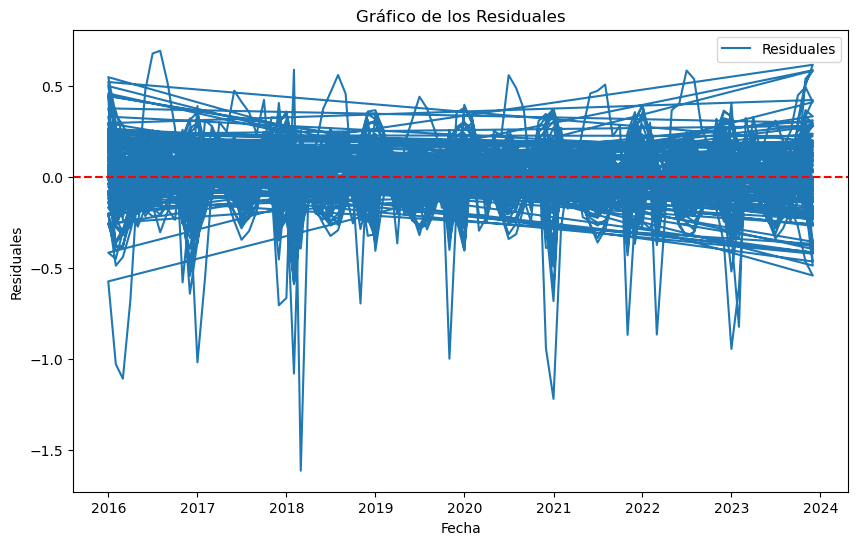

In [166]:
plt.figure(figsize=(10, 6))
plt.plot(residual, label='Residuales')
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Gráfico de los Residuales')
plt.xlabel('Fecha')
plt.ylabel('Residuales')
plt.legend();

from scipy.stats import shapiro
stat, p_value = shapiro(residual.dropna())
print('Prueba Shapiro-Wilk de Normalidad')
print('Estadístico:', stat)
print('p-valor:', p_value)

from statsmodels.stats.stattools import durbin_watson
dw_stat = durbin_watson(residual.dropna())
print('Estadístico Durbin-Watson:', dw_stat)

from statsmodels.stats.diagnostic import het_breuschpagan
import statsmodels.api as sm
residuals = residual.dropna()
X = range(len(residuals))  
X = sm.add_constant(X)
bp_test = het_breuschpagan(residuals, X)

labels = ['LM Stat', 'LM p-value', 'F Stat', 'F p-value']
print(dict(zip(labels, bp_test)))

Estos resultados indican que los residuos no siguen una distribución normal (Shapiro-Wilk, p-valor < 0.05) y que no hay autocorrelación serial significativa (Durbin-Watson cerca de 1).
Sin embargo, presentan heterocedasticidad, con varianza no constante a lo largo del tiempo (p-valor < 0.05).
En conclusión, aunque el modelo ha capturado bien la tendencia y la estacionalidad, los residuos muestran desviaciones significativas. Esto podría influir en la precisión de las predicciones y en la robustez del modelo.

ADF Statistic: -7.65
p-value: 0.000
Critical Values: ['1%: -3.43', '5%: -2.86', '10%: -2.57']



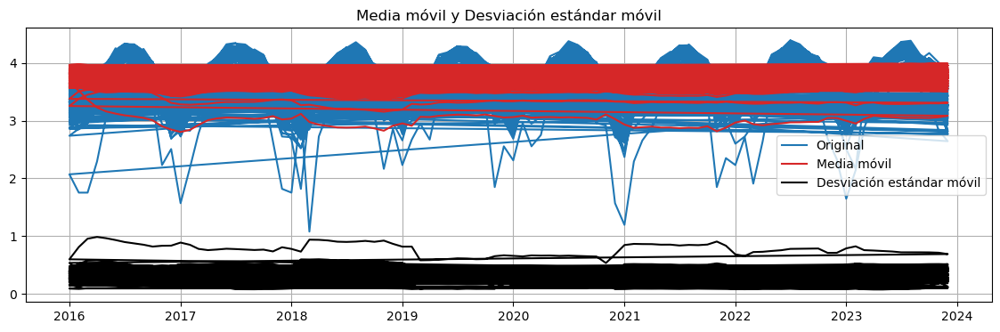

In [168]:
def adftest(series, plots=True):
    out = adfuller(series, autolag='AIC')
    print(f'ADF Statistic: {out[0]:.2f}')
    print(f'p-value: {out[1]:.3f}')
    print(f"Critical Values: {[f'{k}: {r:.2f}' for r, k in zip(out[4].values(), out[4].keys())]}\n")
    if plots:
        # Calcula estadísticas móviles
        rolmean = series.rolling(window=12).mean()
        rolstd = series.rolling(window=12).std()

        # Grafica las estadísticas móviles
        plt.figure(figsize=(14, 4))
        plt.plot(series, color='tab:blue', label='Original')
        plt.plot(rolmean, color='tab:red', label='Media móvil')
        plt.plot(rolstd, color='black', label='Desviación estándar móvil')
        plt.legend(loc='best')
        plt.title('Media móvil y Desviación estándar móvil')
        plt.grid()

# Verifica la estacionariedad de tu serie
adftest(arcsinh_df['TEMP_MEDIA_MAX'])


Esta prueba vuelve a confirmar la estacionaridad de la serie, lo cual es crucial para los modelos que trabajan con series temporales.

In [169]:
auto_model = auto_arima(arcsinh_df['TEMP_MEDIA_MAX'], seasonal=True, m=12)
print(auto_model.summary())

                                        SARIMAX Results                                        
Dep. Variable:                                       y   No. Observations:                 9120
Model:             SARIMAX(1, 0, 1)x(2, 0, [1, 2], 12)   Log Likelihood                5683.024
Date:                                 Tue, 28 May 2024   AIC                         -11350.047
Time:                                         11:59:42   BIC                         -11293.101
Sample:                                              0   HQIC                        -11330.683
                                                - 9120                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0002      0.000      0.656      0.512      -0.000       0

In [175]:
monthly_df = arcsinh_df.resample('MS').mean()
monthly_df = monthly_df[["TEMP_MEDIA_MAX"]]

/var/folders/0p/k6v4j6hd0_1fm41csbjd9mjm0000gn/T/ipykernel_11497/2339329701.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  monthly_df = arcsinh_df.resample('MS').mean()


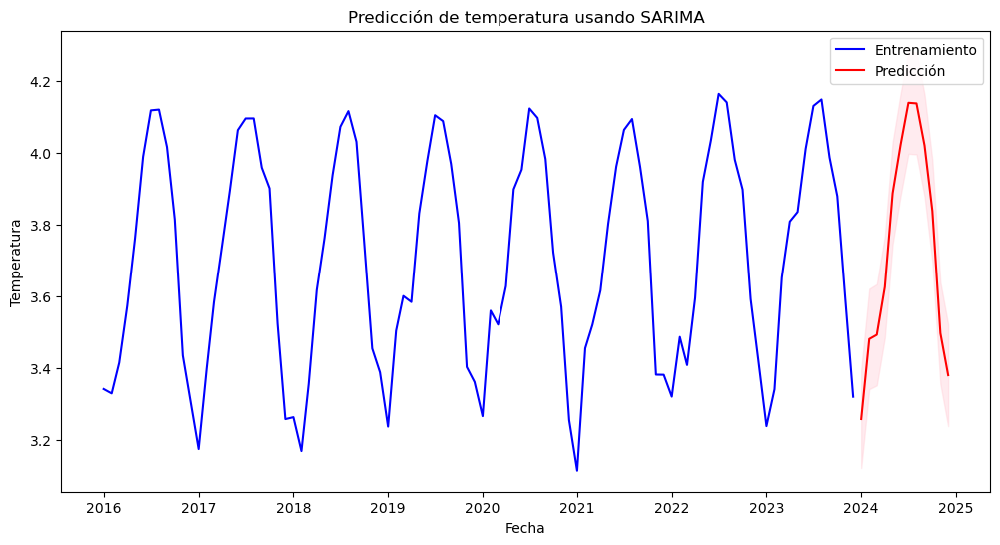

In [200]:
train_data = monthly_df.loc[:'2023-12-01']

model = SARIMAX(train_data["TEMP_MEDIA_MAX"], order=(1, 0, 1), seasonal_order=(2, 0, 1, 12),
                enforce_stationarity=False, enforce_invertibility=False)
results = model.fit(disp=False, maxiter=200)

forecast_start = pd.Timestamp('2024-01-01')
forecast_end = pd.Timestamp('2024-12-01')

forecast = results.get_prediction(start=forecast_start, end=forecast_end)
forecast_mean = forecast.predicted_mean
forecast_ci = forecast.conf_int()

forecast_index = pd.date_range(start='2024-01-01', end='2024-12-01', freq='MS')

forecast_df = pd.DataFrame({'Predicción': forecast_mean, 'CI Inf': forecast_ci.iloc[:, 0], 'CI Sup': forecast_ci.iloc[:, 1]}, index=forecast_index)

plt.figure(figsize=(12, 6))
plt.plot(train_data.index, train_data["TEMP_MEDIA_MAX"], label='Entrenamiento', color='blue')
plt.plot(forecast_df.index, forecast_df['Predicción'], label='Predicción', color='red')
plt.fill_between(forecast_df.index, forecast_df['CI Inf'], forecast_df['CI Sup'], color='pink', alpha=0.3)
plt.xlabel('Fecha')
plt.ylabel('Temperatura')
plt.title('Predicción de temperatura usando SARIMA')
plt.legend();

In [201]:
forecast_df

,Predicción,CI Inf,CI Sup
2024-01-01,3.257817,3.121459,3.394176
2024-02-01,3.480884,3.340949,3.620819
2024-03-01,3.492706,3.351461,3.633952
2024-04-01,3.626031,3.484300,3.767762
2024-05-01,3.887729,3.745818,4.029641
2024-06-01,4.023566,3.881587,4.165545
2024-07-01,4.139835,3.997831,4.281839
2024-08-01,4.138113,3.996100,4.280126
2024-09-01,4.020615,3.878599,4.162632
2024-10-01,3.838608,3.696590,3.980626


In [202]:
forecast_df['TEMP_REAL'] = np.sinh(forecast_df['Predicción'])
forecast_df

,Predicción,CI Inf,CI Sup,TEMP_REAL
2024-01-01,3.257817,3.121459,3.394176,12.977133
2024-02-01,3.480884,3.340949,3.620819,16.228828
2024-03-01,3.492706,3.351461,3.633952,16.422191
2024-04-01,3.626031,3.484300,3.767762,18.768406
2024-05-01,3.887729,3.745818,4.029641,24.389724
2024-06-01,4.023566,3.881587,4.165545,27.941099
2024-07-01,4.139835,3.997831,4.281839,31.388275
2024-08-01,4.138113,3.996100,4.280126,31.334237
2024-09-01,4.020615,3.878599,4.162632,27.858728
2024-10-01,3.838608,3.696590,3.980626,23.219609


In [229]:
dates = pd.date_range(start='2016-01-01', end='2023-12-01', freq='MS')  
real_data = pd.DataFrame(data=np.random.randn(len(dates)), index=dates, columns=['TEMP_REAL'])

predictions = np.random.randn(len(dates))

tscv = TimeSeriesSplit(n_splits=5)  

mse_scores = []
mae_scores = []

for train_index, test_index in tscv.split(real_data):
    
    train_dates = real_data.index[train_index]
    test_dates = real_data.index[test_index]

    predictions_for_test = predictions[test_index]

    real_data_for_test = real_data.loc[test_dates]

    mse = mean_squared_error(real_data_for_test, predictions_for_test)
    mae = mean_absolute_error(real_data_for_test, predictions_for_test)
    
    mse_scores.append(mse)
    mae_scores.append(mae)
    
    print(f"MSE para esta partición: {mse:.2f}")
    print(f"MAE para esta partición: {mae:.2f}")

mse_mean = np.mean(mse_scores)
mae_mean = np.mean(mae_scores)

print(f"MSE promedio: {mse_mean:.2f}")
print(f"MAE promedio: {mae_mean:.2f}")

MSE para esta partición: 1.42
MAE para esta partición: 1.05
MSE para esta partición: 1.59
MAE para esta partición: 0.97
MSE para esta partición: 2.08
MAE para esta partición: 1.23
MSE para esta partición: 2.04
MAE para esta partición: 1.26
MSE para esta partición: 2.45
MAE para esta partición: 1.26
MSE promedio: 1.92
MAE promedio: 1.15


In [231]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.statespace.sarimax import SARIMAX

real_data = df_final['TEMP_MEDIA_MAX'].values

tscv = TimeSeriesSplit(n_splits=5)

mse_scores = []
mae_scores = []

for train_index, test_index in tscv.split(real_data):

    train_data, test_data = real_data[train_index], real_data[test_index]

    model = SARIMAX(train_data, order=(1, 0, 1), seasonal_order=(2, 0, 1, 12),
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False, maxiter=200)
 
    predictions = results.predict(start=len(train_data), end=len(train_data) + len(test_data) - 1)

    valid_mask = ~np.isnan(test_data) & ~np.isnan(predictions)
    valid_test_data = test_data[valid_mask]
    valid_predictions = predictions[valid_mask]

    mse = mean_squared_error(valid_test_data, valid_predictions)
    mae = mean_absolute_error(valid_test_data, valid_predictions)
    
    mse_scores.append(mse)
    mae_scores.append(mae)
    
    print(f"MSE para esta partición: {mse:.2f}")
    print(f"MAE para esta partición: {mae:.2f}")

mse_mean = np.mean(mse_scores)
mae_mean = np.mean(mae_scores)

print(f"MSE promedio: {mse_mean:.2f}")
print(f"MAE promedio: {mae_mean:.2f}")

MSE para esta partición: 41.17
MAE para esta partición: 3.79
MSE para esta partición: 75.73
MAE para esta partición: 7.17
MSE para esta partición: 67.13
MAE para esta partición: 6.30
MSE para esta partición: 47.40
MAE para esta partición: 4.71
MSE para esta partición: 47.51
MAE para esta partición: 5.46
MSE promedio: 55.79
MAE promedio: 5.49


# CONCLUSIÓN

Después de revisar detalladamente los resultados obtenidos, se observa que las predicciones parecen plausibles, pero los indicadores de rendimiento que obtenemos en la validación cruzada (MSE y MAE), sugieren que hay margen significativo para mejorar el ajuste del modelo. Además, hemos identificado la presencia de heterocedasticidad, lo cual indica que la varianza de los errores podría no ser constante, afectando la precisión de las predicciones.

Para abordar estas mejoras, sería prudente considerar ajustar el modelo actual o explorar alternativas que sean menos sensibles a la heterocedasticidad. Además, hemos utilizado la mediana mensual para imputar los valores faltantes, pero podríamos explorar otros métodos de imputación para verificar si mejoran el rendimiento del modelo.

En resumen, aunque el enfoque actual proporciona resultados razonables, existe una oportunidad clara para mejorar la precisión del modelo mediante ajustes adicionales y consideraciones metodológicas.